In [2]:
suppressPackageStartupMessages({
  suppressMessages({
    suppressWarnings({
        library(dplyr)
        library(Seurat)
        library(readr)
        library(ggplot2)
        library("org.Mm.eg.db")
        # convert symbols to ensembl ids
        convert_to_ensembl <- function(symbols) {
            ensembl_ids <- mapIds(org.Mm.eg.db, keys = symbols, keytype = "SYMBOL", column = "ENSEMBL")
            return(ensembl_ids)
        }
        convert_to_symbol <- function(ensembl_ids) {
            symbols <- mapIds(org.Mm.eg.db, keys = ensembl_ids, keytype = "ENSEMBL", column = "SYMBOL")
            return(symbols)
        }
        library(purrr)
    })
  })
})

In [3]:
batch_to_label <- c(exp05 = "batch1", exp06 = "batch2", exp07 = "batch3", exp08 = "batch4", exp09 = "batch5", exp10 = "batch6", exp11 = "batch7", `exp12-13`="batch8", exp14 = "batch9")
# scp updepla_tf_seq_rwd@fts.epfl.ch:sv_fts-updepla/tf_seq/Wangjie/4-Seurat_objects/C3H10_10X_all_exps_D0regressed10pc_50pc_integrated_dosealigned.rds ./
# scp updepla_tf_seq_rwd@fts.epfl.ch:sv_fts-updepla/tf_seq/Wangjie/4-Seurat_objects/C3H10_10X_all_exps_merged_genefiltered_50pc_integrated.rds ./
# scp updepla_tf_seq_rwd@fts.epfl.ch:sv_fts-updepla/tf_seq/Wangjie/4-Seurat_objects/Functional_metadata_C3H10_10X_all_exps_merged_genefiltered_50pc_integrated_functional.rds ./Functional_metadata_C3H10_10X_all_exps_merged_genefiltered_50pc_integrated_functional.rds
# scp updepla_tf_seq_rwd@fts.epfl.ch:sv_fts-updepla/tf_seq/Wangjie/4-Seurat_objects/Metadata_dose_aligned.rds ./Metadata_dose_aligned.rds
# scp updepla_tf_seq_rwd@fts.epfl.ch:sv_fts-updepla/tf_seq/Wangjie/4-Seurat_objects/df_allG1Cells_PhaseCorrected_allTFs_D0regressed10pc_50pc_integrated.rds ./df_allG1Cells_PhaseCorrected_allTFs_D0regressed10pc_50pc_integrated.rds

In [22]:
plots_folder <- path.expand("plots")
if(!dir.exists(plots_folder)) {
    dir.create(plots_folder, recursive = TRUE)
}

In [5]:
data_folder <- path.expand("../../data")

In [6]:
seu <- read_rds(file.path(data_folder, "C3H10_10X_all_exps_D0regressed10pc_50pc_integrated_dosealigned.rds"))

In [8]:
seu2 <- read_rds(file.path(data_folder, "C3H10_10X_all_exps_merged_genefiltered_50pc_integrated.rds"))

In [10]:
metadata_dose_aligned <- read_rds(file.path(data_folder, "Metadata_dose_aligned.rds"))
functional_metadata <- read_rds(file.path(data_folder, "Functional_metadata_C3H10_10X_all_exps_merged_genefiltered_50pc_integrated_functional.rds"))

In [11]:
seu2$Dose <- seu$Log_Vector_UMI
seu2$Dose_aligned <- metadata_dose_aligned
seu2$functional_cells <- functional_metadata

In [12]:
setNames(seu2$functional_cells, colnames(seu2))[colnames(seu)] -> seu$functional_cells

In [14]:
# !scp updepla_tf_seq_rwd@fts.epfl.ch:sv_fts-updepla/tf_seq/Wangjie/6-tmp/TF_categories_on_potency_capacity_dosealigned.csv ./
# 
functionality <- read_csv(file.path(data_folder, "TF_categories_on_potency_capacity_dosealigned.csv"))
colnames(functionality)[1] <- "TF_row"

# strip whitespace
functionality$TF <- map_chr(functionality$TF, stringr::str_trim)
functionality$TF_row <- map_chr(functionality$TF_row, stringr::str_trim)

New names:
• `` -> `...1`


Rows: 232 Columns: 11
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (3): ...1, TF, category
dbl (8): Asym, xmid, scal, Dose.max, Dose.min, startpoint, endpoint, predict...
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (3): ...1, TF, category
dbl (8): Asym, xmid, scal, Dose.max, Dose.min, startpoint, endpoint, predict...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


## Pseudobulk and differential reproducibility

In [15]:
seu_functional <- seu[, seu@meta.data$functional_cells %in% c("TRUE", "D0")]

In [16]:
seu_functional$condition <- paste0(seu_functional$TF, "--", seu_functional$batch)

In [17]:
# rowsums <- rowsum(t(as.matrix(seu_functional@assays$integrate@scale.data)), group = seu_functional$condition)

assay <- "corrected_integrated"
# assay <- "integrated"
rowsums <- rowsum(t(as.matrix(seu_functional@assays[[assay]]@scale.data)), group = seu_functional$condition)

# rowsums <- rowsum(t(as.matrix(seu_functional@assays$integrate@scale.data)), group = seu_functional$condition)
# names <- rownames(rowsums)
# rowsums <- map(rownames(rowsums), function(condition) {
#     rowsums[condition, ] / sum(seu_functional$condition == condition)
# })
# rowsums <- do.call(rbind, rowsums)
# rownames(rowsums) <- names

metadata <- data.frame(
    TF = map_chr(stringr::str_split(rownames(rowsums), "--", ), 1),
    batch = map_chr(stringr::str_split(rownames(rowsums), "--", ), 2),
    condition = rownames(rowsums)
    
)
metadata <- metadata |> left_join(
    seu_functional@meta.data |> 
    group_by(TF, batch) |> 
    summarise(n = n(), max_dose = max(Dose)) |> 
    mutate(condition = paste0(TF, "--", batch))
)

metadata$selected <- metadata$n > 10
rowsums <- rowsums[metadata$selected, ]
metadata <- metadata[metadata$selected, ]

`summarise()` has grouped output by 'TF'. You can override using the `.groups`
argument.
Joining with `by = join_by(TF, batch, condition)`


In [18]:
intersect(metadata |> filter(batch == 'exp14') |> pull(TF), metadata |> filter(batch == 'exp11') |> pull(TF))

[1] "D0"    "Hoxa6" "Klf4"

In [19]:
# Create a seurat assay based on rowsums
assay <- CreateAssayObject(counts = t(rowsums))
assay$data <- t(rowsums)
seu_merged <- CreateSeuratObject(assay, meta.data = metadata) |> ScaleData() |> FindVariableFeatures(nfeatures = 5000) |> RunPCA(features = colnames(rowsums), verbose=F) |> FindNeighbors(verbose=F,k.param = 3) |> RunUMAP(dims = 1:50, verbose=F)

Centering and scaling data matrix

Warning message in eval(predvars, data, env):
“NaNs produced”
Warning message in hvf.info$variance.expected[not.const] <- 10^fit$fitted:
“number of items to replace is not a multiple of replacement length”
Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


In [20]:
functionality |> filter(TF == "Zfp24") |> pull(category)

character(0)

### Pseudobulk

In [32]:
plotdata <- seu_merged@meta.data
plotdata$X <- seu_merged@reductions$umap@cell.embeddings[, 1]
plotdata$Y <- seu_merged@reductions$umap@cell.embeddings[, 2]

TFs_oi <- metadata |> group_by(TF) |> summarise(n = n()) |> arrange(desc(n)) |> filter(!(TF %in% c("D0", "D0_confluent"))) |> filter(n>1)
plots <- map(TFs_oi$TF, function(TF_oi) {
    plotdata_oi <- plotdata |> filter(TF == TF_oi) |> arrange(-max_dose)
    plotdata_d0 <- plotdata |> filter(TF == "D0")

    title <- paste0(toupper(TF_oi))
    capacity <- (functionality |> filter(TF == TF_oi) |> pull(category))

    if ((length(capacity) == 0 || capacity == "low-capacity") && !(TF_oi %in% c("Irf3"))) {
        title <- paste0(title, " (low-capacity)")
    }
    ggplot(plotdata, aes(x = X, y = Y, shape = batch)) + geom_point(data = plotdata |> filter(TF != TF_oi), color = "grey") + 
    geom_point(aes(color = max_dose), data = plotdata_oi, size = 5, stroke = 3) + 
    ggtitle(title) + 
    theme(legend.position = "None") + 
    theme_classic() + 
    theme(
        axis.line=element_blank(),axis.text.x=element_blank(),
        axis.text.y=element_blank(),axis.ticks=element_blank(),
        axis.title.x=element_blank(),
        axis.title.y=element_blank(),legend.position="none",
        panel.background=element_blank(),panel.border=element_blank(),panel.grid.major=element_blank(),
        panel.grid.minor=element_blank(),plot.background=element_blank(), plot.title=element_text(size=14, face="bold", hjust = 0.5)
        ) +
        scale_color_viridis_c(limits = c(2, max(plotdata_oi$max_dose)), name = "Max Dose", option = "viridis", direction = 1) + 
        scale_shape_manual(values = c(exp05 = 1, exp06 = 1, exp07 = 17, exp08 = 17, exp09= 18, exp11 = 15, exp10 = 15, `exp12-13`= 2, exp14 = 16))
})

ncol <- 6
nrow <- ceiling(length(plots) / ncol)
options(repr.plot.width=ncol * 3, repr.plot.height=nrow * 3)
plot <- patchwork::wrap_plots(plots, ncol = ncol, nrow = nrow)

ggsave(file.path(plots_folder, "reproducibility.pdf"), plot, width = ncol * 3, height = nrow * 3)

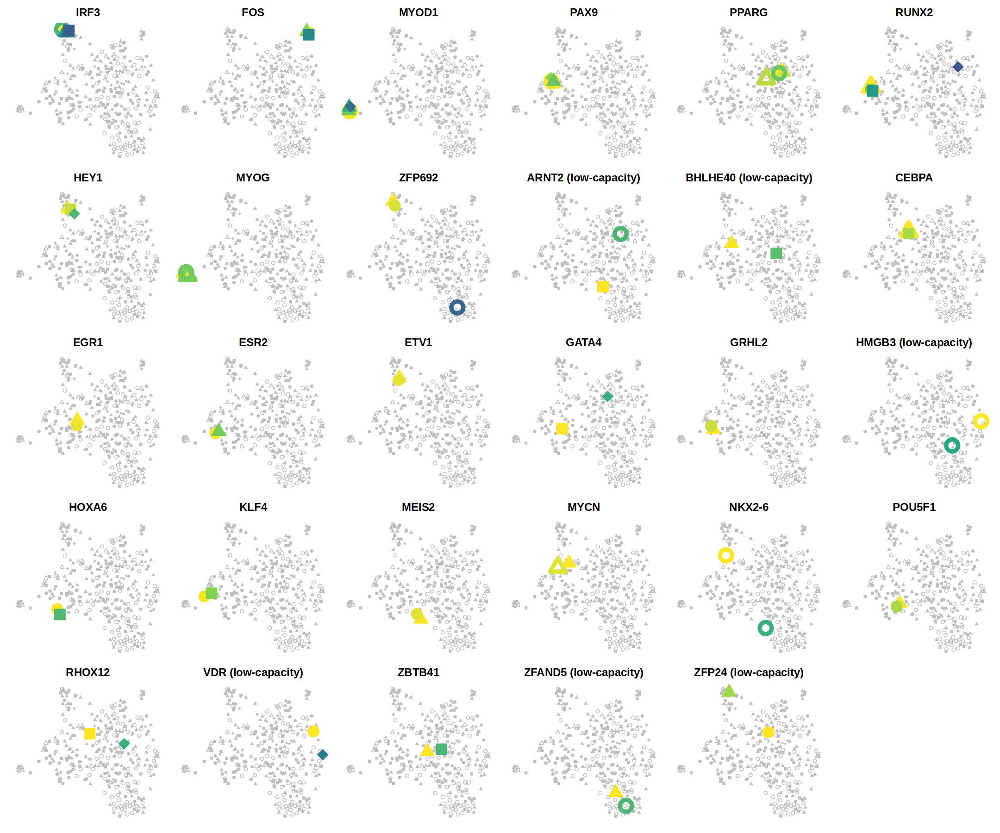

In [33]:
plot

### Differential

In [34]:
rowsums_data <- rowsum(t(as.matrix(seu_functional@assays[["corrected_integrated"]]@data)), group = seu_functional$condition)
names <- rownames(rowsums_data)
rowsums_data <- map(rownames(rowsums_data), function(condition) {
    rowsums_data[condition, ] / sum(seu_functional$condition == condition)
})
rowsums_data <- do.call(rbind, rowsums_data)
rownames(rowsums_data) <- names

# add confluent exp11
rowsums_data <- rbind(rowsums_data, rowsums_data[c(paste0("D0_confluent--", "exp10")),])
rownames(rowsums_data) <- c(rownames(rowsums_data)[1:(nrow(rowsums_data) - 1)], "D0_confluent--exp11")

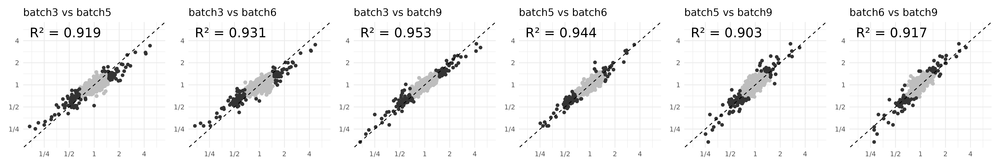

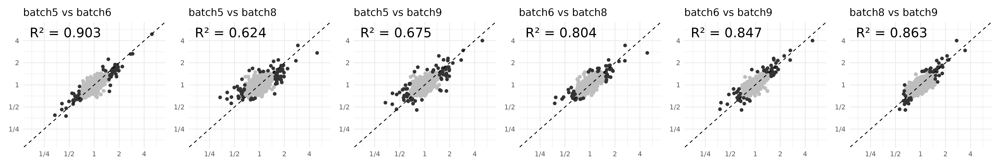

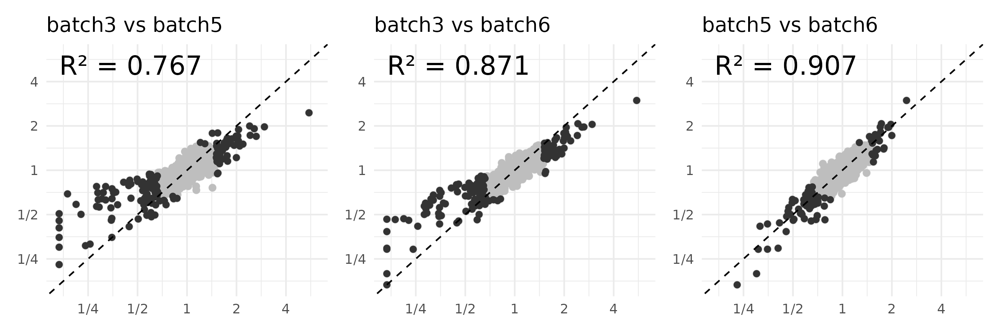

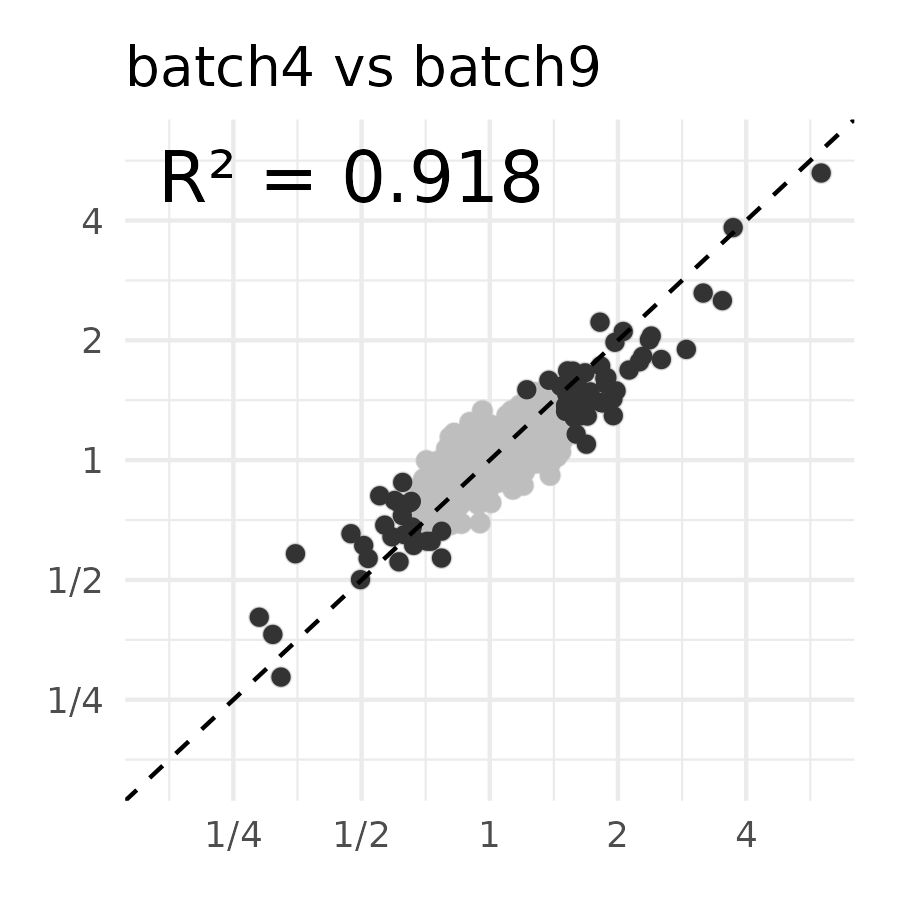

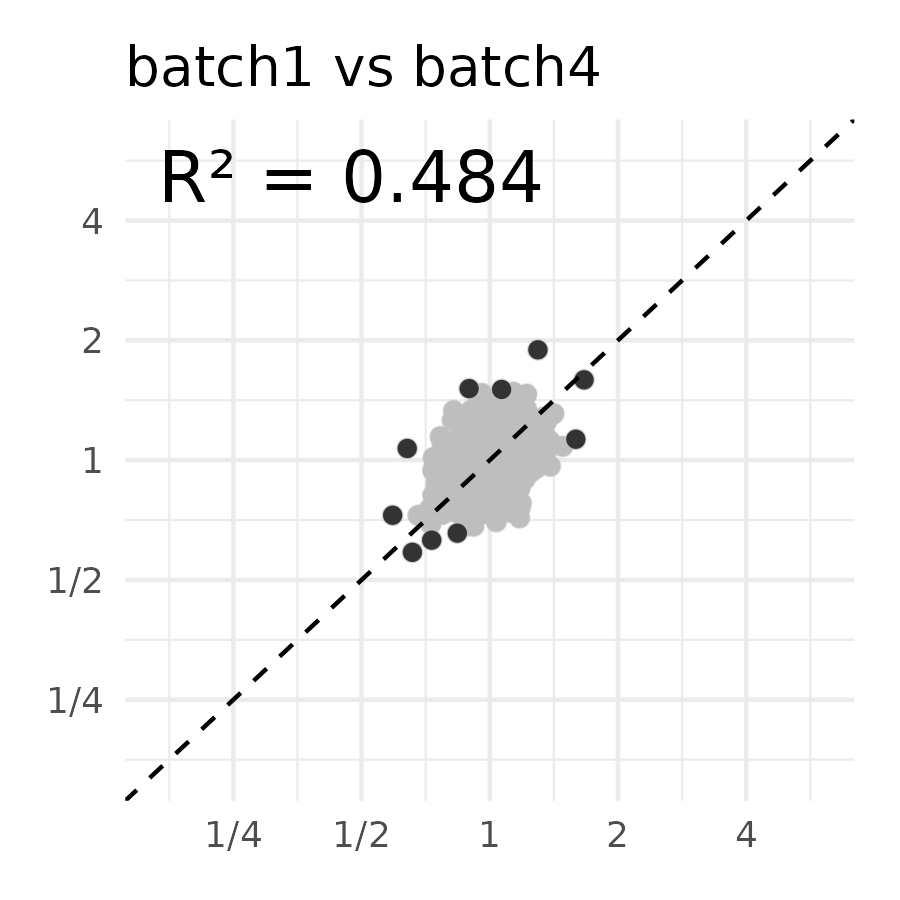

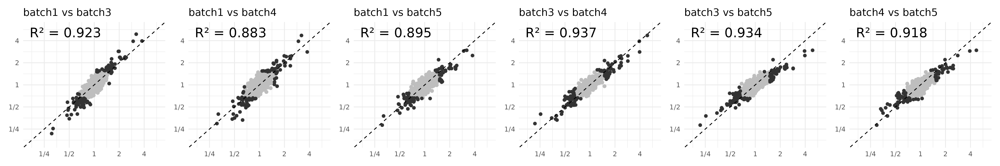

In [49]:
# Take TFs with many DE genes
for (TF_oi in c("Fos", "Runx2", "Hey1", "Pou5f1", "Zfand5", "Pax9")) {
    conditions_oi <- seu_merged@meta.data |> filter(TF == TF_oi) |> pull(condition)
    plots <- list()
    for (condition1 in conditions_oi) {
        for (condition2 in conditions_oi) {
            if (condition1 == condition2) {
                next
            } else if (which(metadata$condition == condition1) > which(metadata$condition == condition2)) {
                next
            }

            batch1 <- metadata |> filter(condition == condition1) |> pull(batch)
            batch2 <- metadata |> filter(condition == condition2) |> pull(batch)
            TF_oi <- metadata |> filter(condition == condition2) |> pull(TF)
            plotdata <- tibble(
                a = rowsums_data[paste0("D0_confluent--", batch1),] - rowsums_data[condition1,],
                b = rowsums_data[paste0("D0_confluent--", batch2),] - rowsums_data[condition2,],
            )
            plotdata_diff <- plotdata |> filter(abs(a) > log(1.5) | abs(b) > log(1.5))

            r2 <- cor(plotdata_diff$a, plotdata_diff$b)^2
            plot <- ggplot(plotdata) + 
            ggrastr::geom_point_rast(aes(x = a, y = b), color = "grey") + 
            geom_point(aes(x = a, y = b), data = plotdata_diff, color = "#333333") + 
            ggtitle(paste0(batch_to_label[batch1], " vs ", batch_to_label[batch2])) + 
            theme_minimal() + 
            geom_abline(intercept = 0, slope = 1, linetype = "dashed") + 
            scale_x_continuous(limits = c(log(1/6), log(6)), labels = c("1/4", "1/2", "1", "2", "4"), breaks = log(c(1/4, 1/2, 1, 2, 4)), oob = scales::oob_squish) + 
            scale_y_continuous(limits = c(log(1/6), log(6)), labels = c("1/4", "1/2", "1", "2", "4"), breaks = log(c(1/4, 1/2, 1, 2, 4)), oob = scales::oob_squish) +
            xlab(NULL) + ylab(NULL) + annotate("text", x = log(1/6), y = log(6), label = paste0("R² = ", round(r2, 3)), hjust = 0, vjust = 1, size = 6)
            plots <- c(plots, list(plot))
        }
    }
    ncol <- min(6, length(plots))
    nrow <- ceiling(length(plots) / ncol)
    options(repr.plot.width=ncol * 3, repr.plot.height=nrow * 3)
    plot <- patchwork::wrap_plots(plots, ncol = ncol, nrow = nrow)
    options(repr.plot.width=ncol * 3, repr.plot.height=nrow * 3)

    ggsave(file.path(plots_folder, paste0("reproducibility_diff_", TF_oi, ".pdf")), plot, width = ncol * 3, height = nrow * 3)
    ggsave(file.path(plots_folder, paste0("reproducibility_diff_", TF_oi, ".png")), plot, width = ncol * 3, height = nrow * 3)

    IRdisplay::display_png(file = file.path(plots_folder, paste0("reproducibility_diff_", TF_oi, ".png")))
}

In [50]:
r2s <- list()
for (TF_oi in functionality |> filter(category != "low-capacity") |> pull(TF)) {
    conditions_oi <- seu_merged@meta.data |> filter(TF == TF_oi) |> pull(condition)
    plots <- list()
    for (condition1 in conditions_oi) {
        for (condition2 in conditions_oi) {
            if (condition1 == condition2) {
                next
            } else if (which(metadata$condition == condition1) > which(metadata$condition == condition2)) {
                next
            }

            batch1 <- metadata |> filter(condition == condition1) |> pull(batch)
            batch2 <- metadata |> filter(condition == condition2) |> pull(batch)
            TF_oi <- metadata |> filter(condition == condition2) |> pull(TF)

            if ((metadata |> filter(condition == condition1) |> pull(max_dose)) < 3.5) {
                next
            }
            if ((metadata |> filter(condition == condition2) |> pull(max_dose)) < 3.5) {
                next
            }

            plotdata <- tibble(
                a = rowsums_data[paste0("D0_confluent--", batch1),] - rowsums_data[condition1,],
                b = rowsums_data[paste0("D0_confluent--", batch2),] - rowsums_data[condition2,],
            )
            plotdata_diff <- plotdata |> filter(abs(a) > log(1.5) | abs(b) > log(1.5))

            r2 <- cor(plotdata_diff$a, plotdata_diff$b)^2

            r2s <- c(r2s, list(tibble(TF = TF_oi, batch1 = batch1, batch2 = batch2, r2 = r2)))
        }
    }
}
r2s <- bind_rows(r2s)

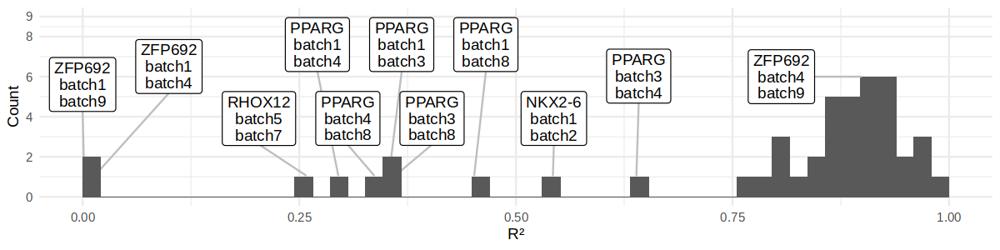

In [51]:
plotdata <- r2s
plotdata_annot <- plotdata |> filter((r2 < 0.7) )
plotdata_annot2 <- plotdata |> filter((r2 > 0.7) & (TF == "Zfp692"))
plot <- ggplot(plotdata, aes(x = r2)) + 
ggrepel::geom_label_repel(data = plotdata_annot, aes(label = paste0(toupper(TF), "\n", batch_to_label[batch1],"\n",batch_to_label[batch2]), y = 1, x = r2), box.padding = 0.5, point.padding = 0.5, segment.color = "grey", segment.size = 0.5, nudge_y = 5., lineheight = 0.9) + 
geom_histogram(breaks = seq(0, 1, length.out = 50)) + 
ggrepel::geom_label_repel(data = plotdata_annot2, aes(label = paste0(toupper(TF), "\n", batch_to_label[batch1],"\n", batch_to_label[batch2]), y = 6, x = r2), box.padding = 0.5, point.padding = 0.5, segment.color = "grey", segment.size = 0.5, nudge_y = 0., nudge_x = -0.1, lineheight = 0.9) + 
theme_minimal() + 
scale_y_continuous(limits = c(0, 9), breaks = c(0, 2, 4, 6, 8, 9)) + 
xlab("R²") + 
ylab("Count")
ggsave(file.path(plots_folder, "reproducibility_r2.pdf"), plot, width = 10, height = 2.5)
options(repr.plot.width=10, repr.plot.height=2.5)
plot

## Single-cell reproducibility

In [52]:
batch_colors <- c(exp05 = "#2E2591", exp06 = "#338935", exp07 = "#5DA899", exp08 = "#7E2954", exp09 = "#9F4A96", exp10 = "#94CBE8", exp11 = "#E69F00", `exp12-13` = "#DCC07D", exp14 = "#C26A76")

In [53]:
library(ggrastr)

Warning message:
“package ‘ggrastr’ was built under R version 4.3.3”


In [54]:
plotdata <- seu2@meta.data
plotdata$X <- seu2@reductions$umap@cell.embeddings[, 1]
plotdata$Y <- seu2@reductions$umap@cell.embeddings[, 2]

plots <- list()
# for (TF_oi in c("Runx2")) {
for (TF_oi in c("Fos", "Irf3", "Runx2", "Hey1", "Myod1", "Myog", "Pax9", "Hey1", "Zfp692", "Cebpa", "Egr1", "Esr2")) {
    plotdata_oi <- plotdata[(plotdata$TF == TF_oi) & (plotdata$functional_cells == "TRUE"),]
    # plotdata_oi <- plotdata[(plotdata$TF == "Pou5f1"),]
    # randomize order
    set.seed(5)
    plotdata_oi <- plotdata_oi[sample(nrow(plotdata_oi)),]

    plotdata_oi |> group_by(batch) |> summarise(n = n()) |> arrange(-n) |> pull(batch) -> batch_order
    plotdata_oi$batch <- factor(plotdata_oi$batch, levels = batch_order)
    plotdata_oi <- plotdata_oi |> arrange(batch)

    options(repr.plot.width=6, repr.plot.height=6)
    plot <- ggplot(plotdata, aes(x = X, y = Y)) + 
    geom_point_rast(aes(), size = 0.1, color = "#DDDDDD") + 
    geom_point(aes(color = batch), data = plotdata_oi, size = 0.25) + 
    scale_color_manual(values = batch_colors) +
    theme_classic() + 
    theme(legend.position = "None") +
    theme(
        axis.line=element_blank(),axis.text.x=element_blank(),
        axis.text.y=element_blank(),axis.ticks=element_blank(),
        axis.title.x=element_blank(),
        axis.title.y=element_blank(),legend.position="none",
        panel.background=element_blank(),panel.border=element_blank(),panel.grid.major=element_blank(),
        panel.grid.minor=element_blank(),plot.background=element_blank(), plot.title=element_text(size=14, face="bold", hjust = 0.5)
    ) +
    ggtitle(toupper(TF_oi))
    plots <- c(plots, list(plot))
}
ncol <- 6
nrow <- ceiling(length(plots) / ncol)
options(repr.plot.width=ncol * 3, repr.plot.height=nrow * 3)
plot <- patchwork::wrap_plots(plots, ncol = ncol, nrow)

ggsave(file.path(plots_folder, "functional_cells.pdf"), plot, width = ncol * 3, height = nrow * 3)

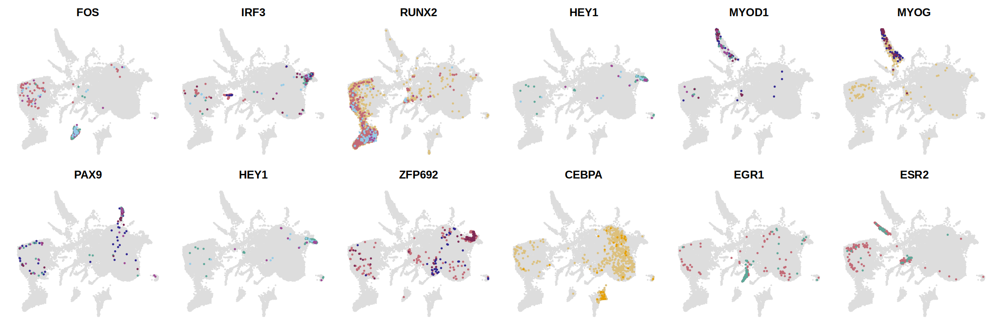

In [55]:
plot

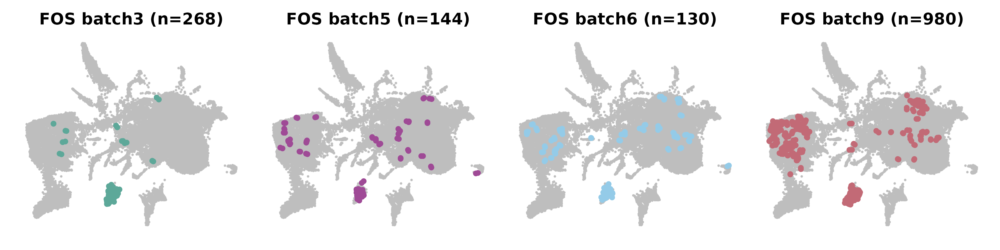

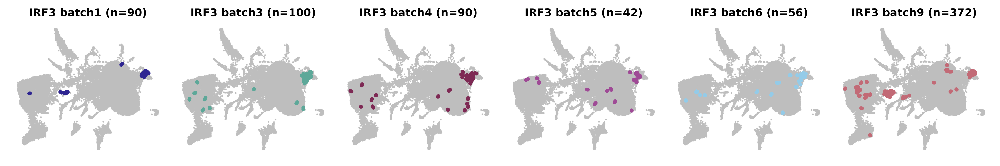

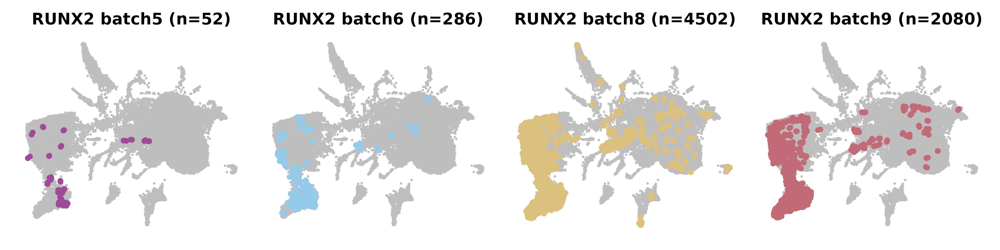

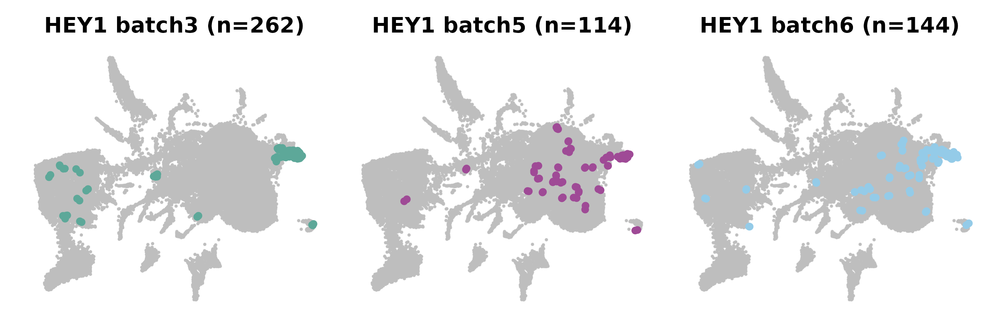

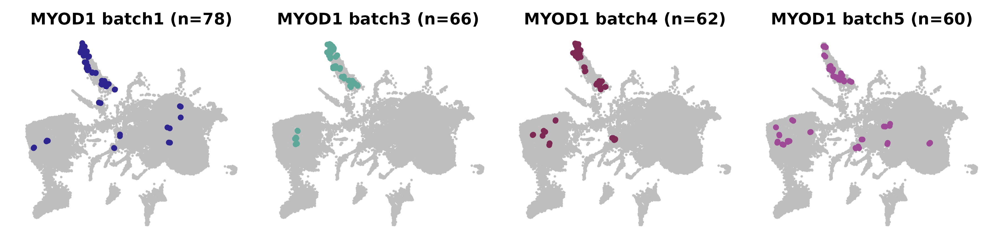

...

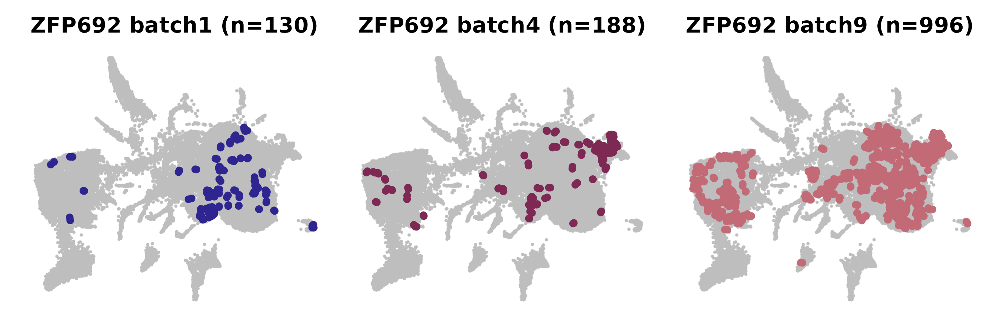

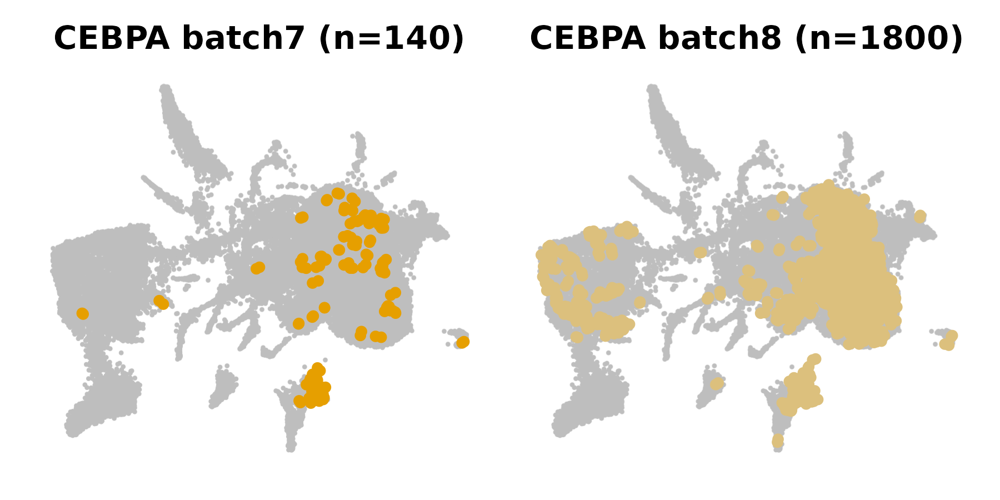

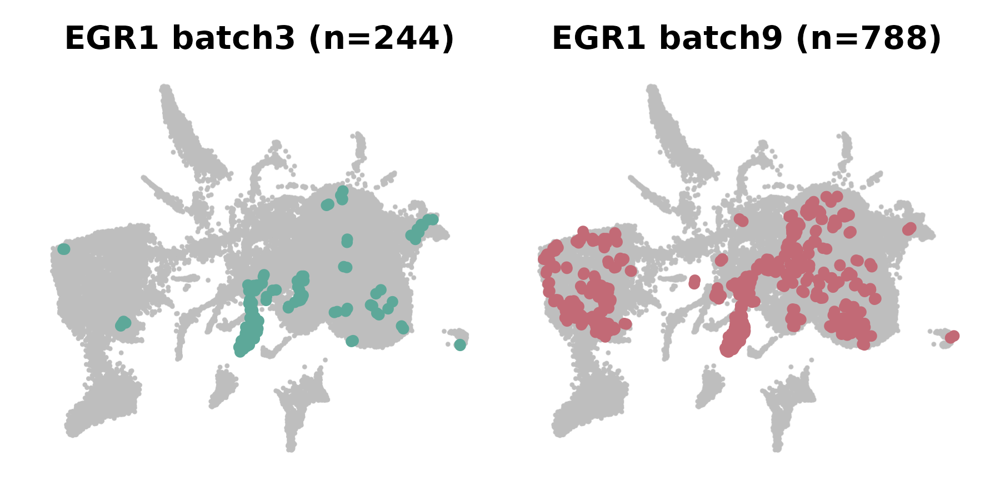

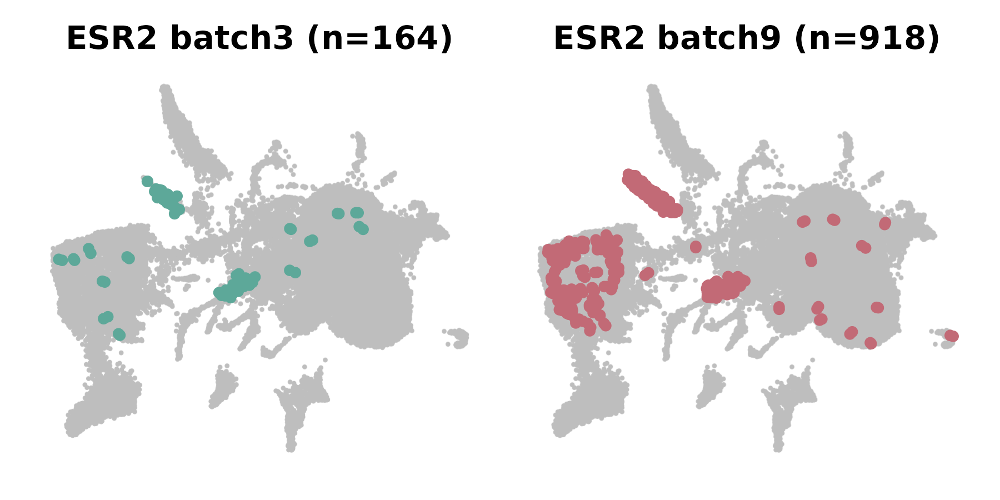

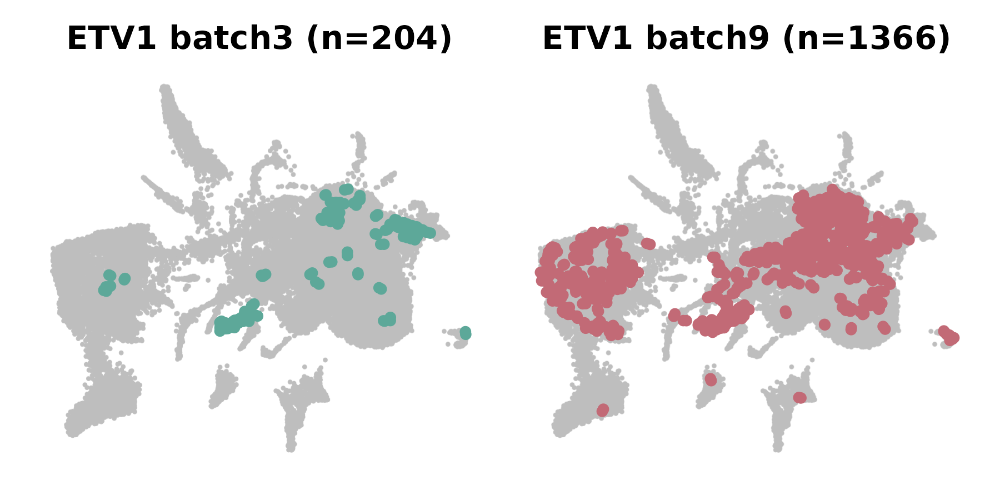

In [56]:
plotdata <- seu2@meta.data
plotdata$X <- seu2@reductions$umap@cell.embeddings[, 1]
plotdata$Y <- seu2@reductions$umap@cell.embeddings[, 2]

for (TF_oi in c("Fos", "Irf3", "Runx2", "Hey1", "Myod1", "Myog", "Pax9", "Pparg", "Zfp692", "Cebpa", "Egr1", "Esr2", "Etv1")) {
    plots <- list()
    set.seed(5)

    plotdata_tf <- plotdata[(plotdata$TF == TF_oi) & (plotdata$functional_cells == "TRUE"),]

    for (batch in unique(plotdata_tf$batch)) {
        # plotdata_oi <- plotdata[(plotdata$TF == TF_oi) & (plotdata$functional_cells == "TRUE") & (plotdata$batch == batch),]
        plotdata_oi <- plotdata[(plotdata$TF == TF_oi) & (plotdata$batch == batch),]
        plotdata_oi <- plotdata_oi[sample(nrow(plotdata_oi)),]
        # plotdata_oi <- plotdata_oi |> arrange(Dose)
        plotdata_oi_batch <- plotdata_oi |> filter(batch == batch)
        plotdata_oi_batch$X <- plotdata_oi_batch$X + rnorm(nrow(plotdata_oi_batch), sd = 0.1)
        plotdata_oi_batch$Y <- plotdata_oi_batch$Y + rnorm(nrow(plotdata_oi_batch), sd = 0.1)
        plotdata_oi <- rbind(plotdata_oi, plotdata_oi_batch)
        n <- nrow(plotdata_oi)

        plot <- ggplot(plotdata, aes(x = X, y = Y)) + 
        geom_point_rast(aes(), size = 0.1, color = "grey") + 
        # geom_point(aes(color = Dose), data = plotdata_oi, size = 1) + 
        # scale_color_viridis_c(limits = c(2, max(plotdata_tf$Dose)), option = "viridis", direction = 1, oob = scales::oob_squish) +
        geom_point(aes(color = batch), data = plotdata_oi, size = 1, stroke = 1) + 
        scale_color_manual(values = batch_colors) +
        theme_classic() + 
        theme(legend.position = "None") +
        theme(
            axis.line=element_blank(),axis.text.x=element_blank(),
            axis.text.y=element_blank(),axis.ticks=element_blank(),
            axis.title.x=element_blank(),
            axis.title.y=element_blank(),legend.position="none",
            panel.background=element_blank(),panel.border=element_blank(),panel.grid.major=element_blank(),
            panel.grid.minor=element_blank(),plot.background=element_blank(), plot.title=element_text(size=14, face="bold", hjust = 0.5)
        ) +
        ggtitle(paste0(toupper(TF_oi), " ", batch_to_label[batch], " (n=", n, ")"))
        plots <- c(plots, list(plot))
    }
    ncol <- min(6, length(plots))
    nrow <- ceiling(length(plots) / ncol)
    options(repr.plot.width=ncol * 3, repr.plot.height=nrow * 3)
    plot <- patchwork::wrap_plots(plots, ncol = ncol, nrow)

    ggsave(file.path(plots_folder, paste0("functional_cells_batch_", TF_oi, ".pdf")), plot, width = ncol * 3, height = nrow * 3)
    ggsave(file.path(plots_folder, paste0("functional_cells_batch_", TF_oi, ".png")), plot, width = ncol * 3, height = nrow * 3)
    IRdisplay::display_png(file = file.path(plots_folder, paste0("functional_cells_batch_", TF_oi, ".png")))
}

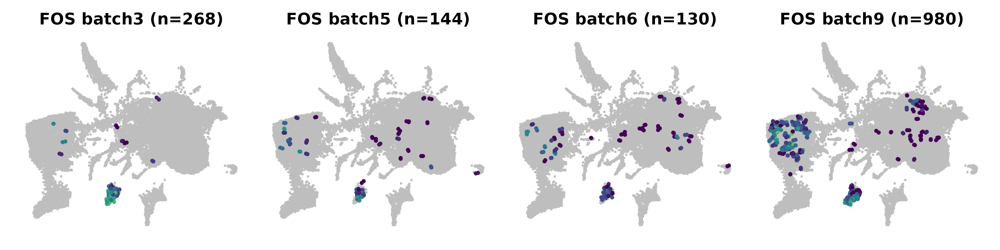

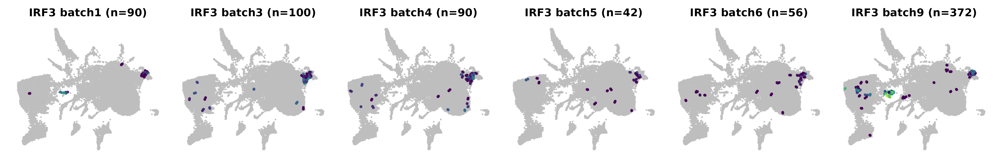

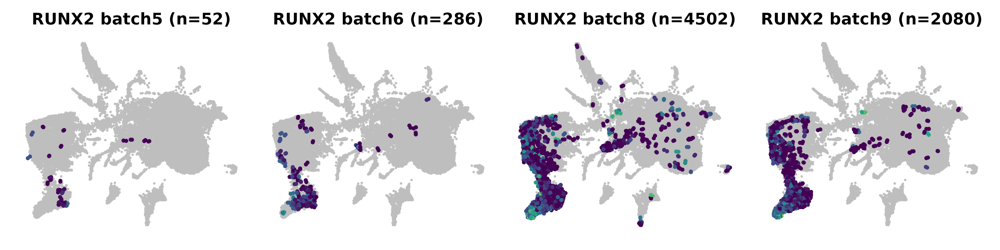

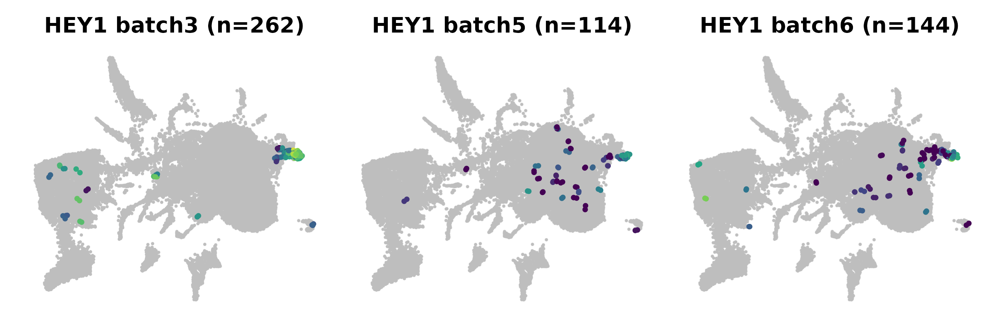

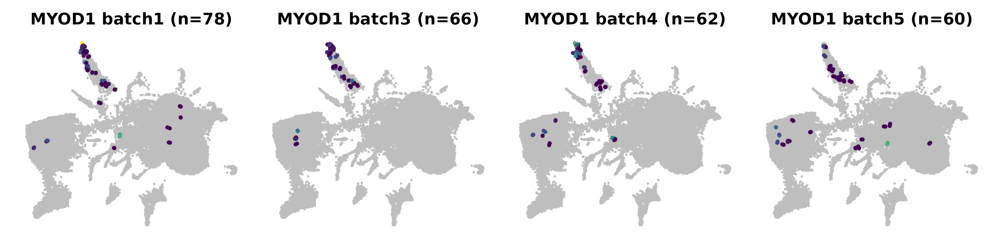

...

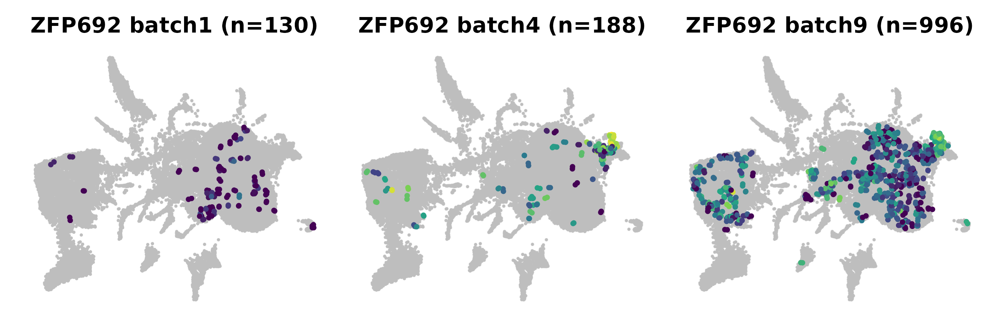

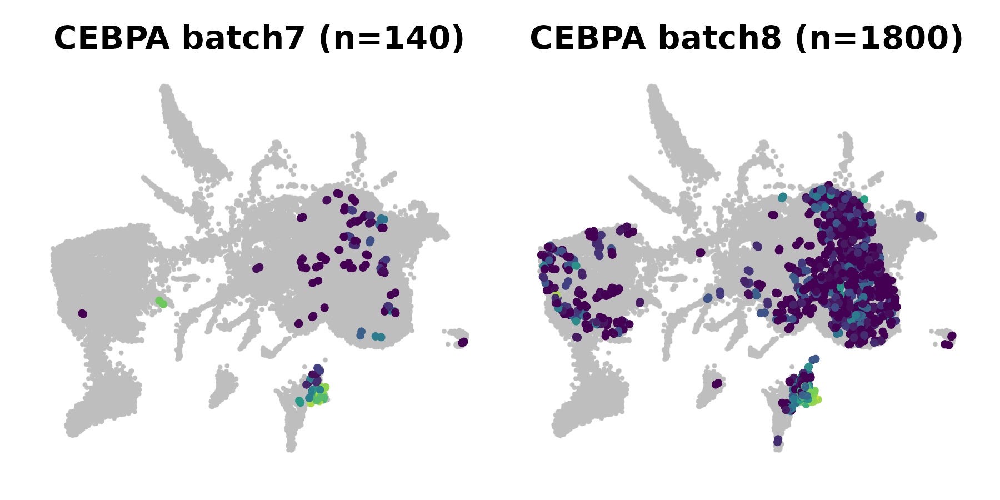

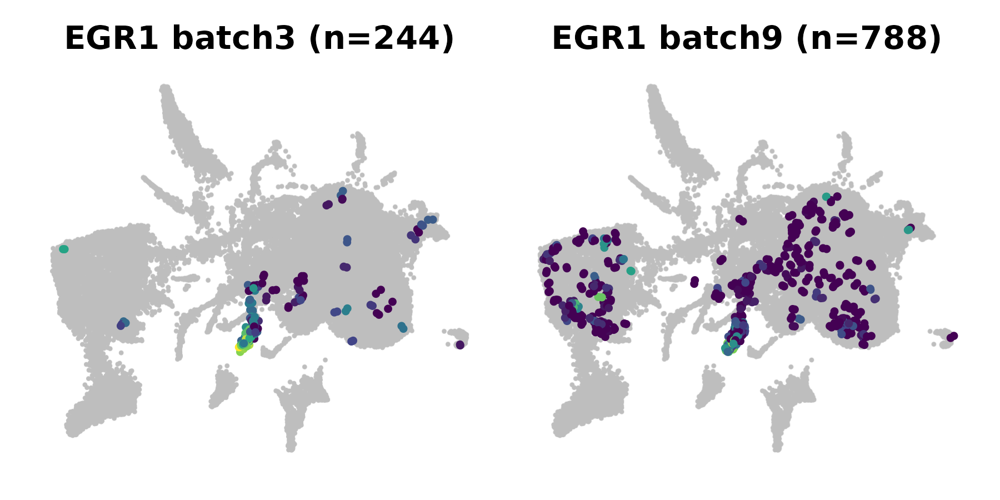

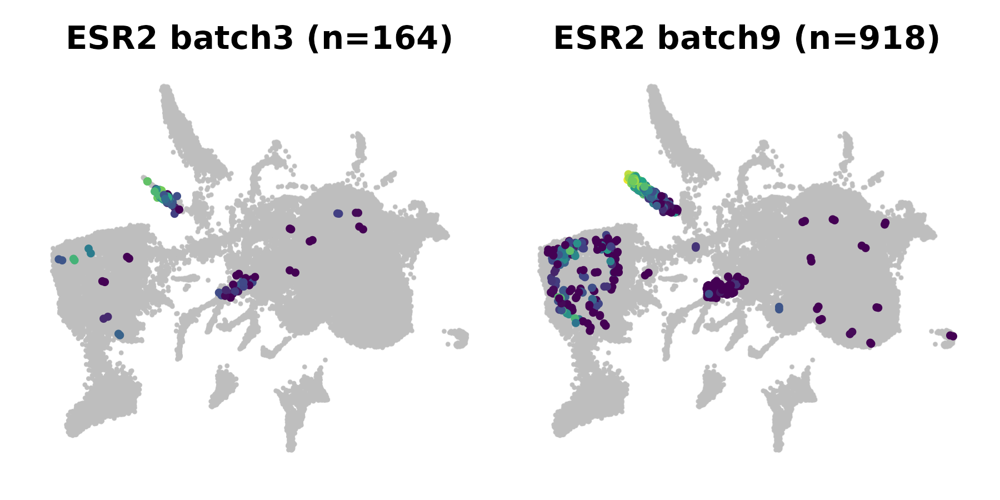

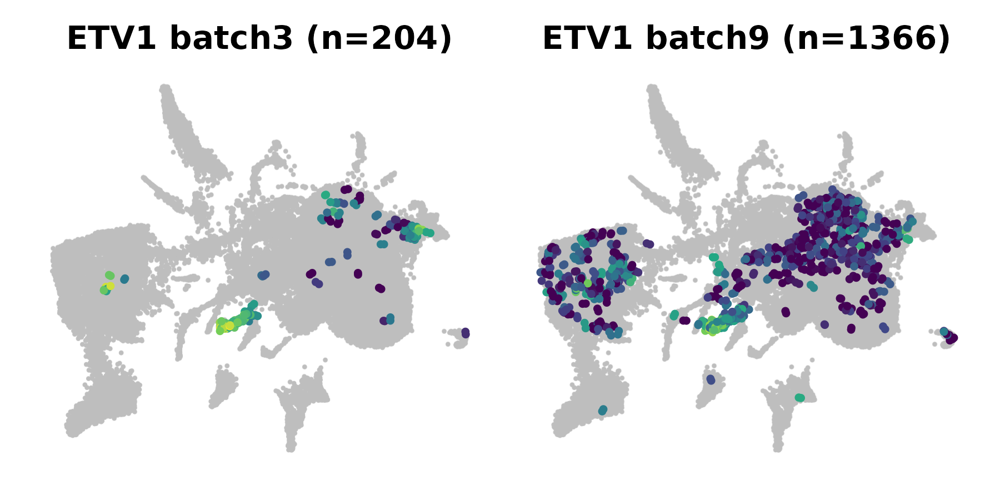

In [57]:
plotdata <- seu2@meta.data
plotdata$X <- seu2@reductions$umap@cell.embeddings[, 1]
plotdata$Y <- seu2@reductions$umap@cell.embeddings[, 2]

for (TF_oi in c("Fos", "Irf3", "Runx2", "Hey1", "Myod1", "Myog", "Pax9", "Pparg", "Zfp692", "Cebpa", "Egr1", "Esr2", "Etv1")) {
# for (TF_oi in c("Pax9")) {
# for (TF_oi in c("Klf4", "Hoxa6")) {
# for (TF_oi in c("Esr2", "Etv1")) {
# for (TF_oi in c("Runx2", "Cebpa", "Myod1", "Myog")) {
    plots <- list()
    # plotdata_oi <- plotdata[(plotdata$TF == "Pou5f1"),]
    # randomize order
    set.seed(5)

    plotdata_tf <- plotdata[(plotdata$TF == TF_oi) & (plotdata$functional_cells == "TRUE"),]

    for (batch in unique(plotdata_tf$batch)) {
        # plotdata_oi <- plotdata[(plotdata$TF == TF_oi) & (plotdata$functional_cells == "TRUE") & (plotdata$batch == batch),]
        plotdata_oi <- plotdata[(plotdata$TF == TF_oi) & (plotdata$batch == batch),]
        plotdata_oi <- plotdata_oi[sample(nrow(plotdata_oi)),]
        # plotdata_oi <- plotdata_oi |> arrange(Dose)
        plotdata_oi_batch <- plotdata_oi |> filter(batch == batch)
        plotdata_oi_batch$X <- plotdata_oi_batch$X + rnorm(nrow(plotdata_oi_batch), sd = 0.1)
        plotdata_oi_batch$Y <- plotdata_oi_batch$Y + rnorm(nrow(plotdata_oi_batch), sd = 0.1)
        plotdata_oi <- rbind(plotdata_oi, plotdata_oi_batch)
        n <- nrow(plotdata_oi)

        plot <- ggplot(plotdata, aes(x = X, y = Y)) + 
        geom_point_rast(aes(), size = 0.1, color = "grey") + 
        geom_point(aes(color = Dose), data = plotdata_oi, size = 1) + 
        scale_color_viridis_c(limits = c(2, max(plotdata_tf$Dose)), option = "viridis", direction = 1, oob = scales::oob_squish) +
        # geom_point(aes(color = batch), data = plotdata_oi, size = 1, stroke = 1) + 
        # scale_color_manual(values = batch_colors) +
        theme_classic() + 
        theme(legend.position = "None") +
        theme(
            axis.line=element_blank(),axis.text.x=element_blank(),
            axis.text.y=element_blank(),axis.ticks=element_blank(),
            axis.title.x=element_blank(),
            axis.title.y=element_blank(),legend.position="none",
            panel.background=element_blank(),panel.border=element_blank(),panel.grid.major=element_blank(),
            panel.grid.minor=element_blank(),plot.background=element_blank(), plot.title=element_text(size=14, face="bold", hjust = 0.5)
        ) +
        ggtitle(paste0(toupper(TF_oi), " ", batch_to_label[batch], " (n=", n, ")"))
        plots <- c(plots, list(plot))
    }
    ncol <- min(6, length(plots))
    nrow <- ceiling(length(plots) / ncol)
    options(repr.plot.width=ncol * 3, repr.plot.height=nrow * 3)
    plot <- patchwork::wrap_plots(plots, ncol = ncol, nrow)

    ggsave(file.path(plots_folder, paste0("functional_cells_", TF_oi, ".pdf")), plot, width = ncol * 3, height = nrow * 3)
    ggsave(file.path(plots_folder, paste0("functional_cells_", TF_oi, ".png")), plot, width = ncol * 3, height = nrow * 3)
    IRdisplay::display_png(file = file.path(plots_folder, paste0("functional_cells_", TF_oi, ".png")))
}

### Before and after integration

In [58]:
seu@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,TF,percent.mito,percent.rRNA,percent.ProtCod,Vector_10X,Vector_UMI,Log_Vector_UMI,⋯,Phase,S.Score,G2M.Score,batch,Dose,batch_overall,nCount_corrected,nFeature_corrected,Dose_aligned,functional_cells
,<chr>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,⋯,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<int>,<dbl>,<chr>
AAACCTGAGATGTAAC-1-5,SeuratProject,9094,3599,Zbtb16,2.220756,13.73131,94.21724,2,1,0.6931472,⋯,S,0.37814236,0.37516921,exp05,0.6931472,batch1,9094,3599,0.6931472,TRUE
AAACCTGGTCTTCTCG-1-5,SeuratProject,5506,2403,Nkx2-6,2.633013,16.96023,90.86617,1,1,0.6931472,⋯,G1,-0.08788157,-0.08643372,exp05,0.6931472,batch1,5506,2403,0.6931472,TRUE
AAACGGGAGCCAGTAG-1-5,SeuratProject,4854,2122,Atf3,2.447552,21.61662,94.03538,8,15,2.7725887,⋯,G1,-0.08451127,-0.02988873,exp05,2.7725887,batch1,4854,2122,2.7725887,TRUE
AAACGGGAGGTCGGAT-1-5,SeuratProject,5322,2263,Smad3,2.309859,18.29108,94.94836,3,2,1.0986123,⋯,G1,-0.09994069,-0.06923859,exp05,1.0986123,batch1,5322,2263,1.0986123,FALSE
AAACGGGCAATAACGA-1-5,SeuratProject,4719,1977,D0,3.130288,23.77327,91.96277,9,15,2.7725887,⋯,G1,-0.03155916,-0.07736470,exp05,0.0000000,batch1,4719,1977,0.0000000,D0
AAACGGGCATGGTAGG-1-5,SeuratProject,12256,3902,Nkx2-6,1.721325,16.54430,95.96998,2,4,1.6094379,⋯,G1,-0.04993478,-0.09083070,exp05,1.6094379,batch1,12256,3902,1.6094379,TRUE
AAACGGGGTTGTTTGG-1-5,SeuratProject,4568,2065,Hoxb2,2.639040,19.54198,93.30425,17,35,3.5835189,⋯,G1,-0.06075141,-0.03845570,exp05,3.5835189,batch1,4568,2065,3.5835189,TRUE
AAAGATGAGACTGTAA-1-5,SeuratProject,4701,1953,Osr1,2.188230,25.74888,93.07414,6,6,1.9459101,⋯,G1,-0.03623677,-0.04612706,exp05,1.9459101,batch1,4701,1953,1.9459101,TRUE
AAAGATGAGGCAATTA-1-5,SeuratProject,15683,4007,Myod1,4.296277,12.20678,93.41535,5,9,2.3025851,⋯,G1,-0.05657321,-0.05927586,exp05,2.3025851,batch1,15683,4007,2.3025851,TRUE


In [ ]:
plotdata <- seu2@meta.data
plotdata$X <- seu2@reductions$umap@cell.embeddings[, 1]
plotdata$Y <- seu2@reductions$umap@cell.embeddings[, 2]

for (TF_oi in c("Fos", "Irf3", "Runx2", "Hey1", "Myod1", "Myog", "Pax9", "Pparg", "Zfp692", "Cebpa", "Egr1", "Esr2", "Etv1")) {
    plots <- list()
    # plotdata_oi <- plotdata[(plotdata$TF == "Pou5f1"),]
    # randomize order
    set.seed(5)

    plotdata_tf <- plotdata[(plotdata$TF == TF_oi) & (plotdata$functional_cells == "TRUE"),]

    for (layer in c("RNA", "integrated")) {
        # plotdata_oi <- plotdata[(plotdata$TF == TF_oi) & (plotdata$functional_cells == "TRUE") & (plotdata$batch == batch),]
        plotdata_oi <- plotdata[(plotdata$TF == TF_oi),]
        plotdata_oi <- plotdata_oi[sample(nrow(plotdata_oi)),]
        # plotdata_oi <- plotdata_oi |> arrange(Dose)
        plotdata_oi_batch <- plotdata_oi |> filter(batch == batch)
        plotdata_oi_batch$X <- plotdata_oi_batch$X + rnorm(nrow(plotdata_oi_batch), sd = 0.1)
        plotdata_oi_batch$Y <- plotdata_oi_batch$Y + rnorm(nrow(plotdata_oi_batch), sd = 0.1)
        plotdata_oi <- rbind(plotdata_oi, plotdata_oi_batch)
        n <- nrow(plotdata_oi)

        plot <- ggplot(plotdata, aes(x = X, y = Y)) + 
        geom_point_rast(aes(), size = 0.1, color = "grey") + 
        geom_point(aes(color = Dose), data = plotdata_oi, size = 1) + 
        scale_color_viridis_c(limits = c(2, max(plotdata_tf$Dose)), option = "viridis", direction = 1, oob = scales::oob_squish) +
        # geom_point(aes(color = batch), data = plotdata_oi, size = 1, stroke = 1) + 
        # scale_color_manual(values = batch_colors) +
        theme_classic() + 
        theme(legend.position = "None") +
        theme(
            axis.line=element_blank(),axis.text.x=element_blank(),
            axis.text.y=element_blank(),axis.ticks=element_blank(),
            axis.title.x=element_blank(),
            axis.title.y=element_blank(),legend.position="none",
            panel.background=element_blank(),panel.border=element_blank(),panel.grid.major=element_blank(),
            panel.grid.minor=element_blank(),plot.background=element_blank(), plot.title=element_text(size=14, face="bold", hjust = 0.5)
        ) +
        ggtitle(paste0(toupper(TF_oi), " ", batch_to_label[batch], " (n=", n, ")"))
        plots <- c(plots, list(plot))
    }
    ncol <- min(6, length(plots))
    nrow <- ceiling(length(plots) / ncol)
    options(repr.plot.width=ncol * 3, repr.plot.height=nrow * 3)
    plot <- patchwork::wrap_plots(plots, ncol = ncol, nrow)

    # ggsave(file.path(plots_folder, paste0("functional_cells_", TF_oi, ".pdf")), plot, width = ncol * 3, height = nrow * 3)
}

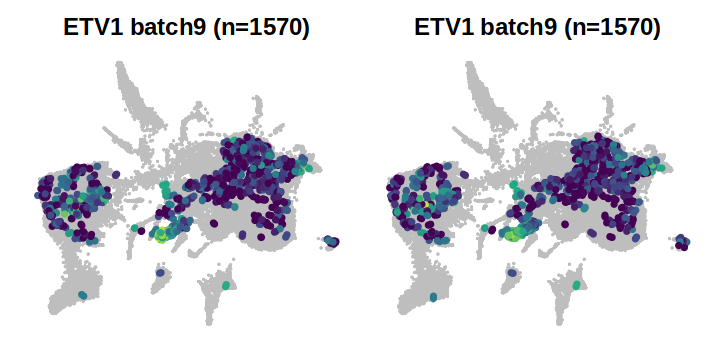

In [60]:
plot

## Dose reproducibility

In [61]:
select_tf_dataset <- function(seu, tf, batches = NULL) {
    filtered_tf <- seu@meta.data |> filter((TF == !!tf) & (Phase == "G1"))
    if (is.null(batches)) {
        batches_oi <- unique(filtered_tf$batch_overall)
    } else {
        batches_oi <- batches
    }
    filtered_control <- seu@meta.data |> filter((TF %in% c("D0", "D0_confluent")) & (Phase == "G1") & (batch_overall %in% batches_oi))
    filtered_tf <- filtered_tf |> filter(batch_overall %in% batches_oi)
    filtered <- rbind(filtered_control, filtered_tf)
    seu <- seu |> subset(cells = rownames(filtered))
    return(seu)
}


select_tf_datasets <- function(seu, tf, batches = NULL) {
    filtered_tf <- seu@meta.data |> filter((TF == !!tf) & (Phase == "G1"))
    if (is.null(batches)) {
        batches_oi <- unique(filtered_tf$batch_overall)
    } else {
        batches_oi <- batches
    }
    filtered_control <- seu@meta.data |> filter((TF %in% c("D0", "D0_confluent")) & (Phase == "G1") & (batch_overall %in% batches_oi))
    filtered_tf <- filtered_tf |> filter(batch_overall %in% batches_oi)
    filtered <- rbind(filtered_control, filtered_tf)

    datasets <- list()
    for (batch in batches_oi) {
        filtered_oi <- filtered |> filter(batch_overall == !!batch)
        dataset <- seu |> subset(cells = rownames(filtered_oi))
        datasets[[batch]] <- dataset
    }
    return(datasets)
}

select_tf_datasets_batch <- function(seu, tf, batches = NULL) {
    filtered_tf <- seu@meta.data |> filter((TF == !!tf) & (Phase == "G1"))
    if (is.null(batches)) {
        batches_oi <- unique(filtered_tf$batch)
    } else {
        batches_oi <- batches
    }
    filtered_control <- seu@meta.data |> filter((TF %in% c("D0", "D0_confluent")) & (Phase == "G1") & (batch %in% batches_oi))
    filtered_tf <- filtered_tf |> filter(batch %in% batches_oi)
    filtered <- rbind(filtered_control, filtered_tf)

    datasets <- list()
    for (batch in batches_oi) {
        filtered_oi <- filtered |> filter(batch == !!batch)
        dataset <- seu |> subset(cells = rownames(filtered_oi))
        datasets[[batch]] <- dataset
    }
    return(datasets)
}

In [62]:
seu2$batch_overall <- unname(c(exp05 = "batch1", exp06 = "batch1", exp07 = "batch2", exp08 = "batch2", exp09 = "batch3", exp10 = "batch4", exp11 = "batch4", `exp12-13`="batch5", exp14 = "batch6")[seu2$batch])

In [63]:
# TF_oi <- "Runx2"
TF_oi <- "Fos"
# TF_oi <- "Hoxa6"
# TF_oi <- "Irf3"
# TF_oi <- "Gata4"
# TF_oi <- "Zfp692"
# TF_oi <- "Rhox12"

name <- TF_oi
seu_tf <- select_tf_dataset(seu2, TF_oi) # use original data for differential genes
seu_tf <- SetIdent(seu_tf, value = "TF")
markers <- FindMarkers(seu_tf, ident.1 = "D0_confluent", ident.2 = TF_oi)
markers <- markers[!(rownames(markers) %in% c("ENSMUSG00000086474", "ENSMUSG00000111467", "ENSMUSG00000097652", "ENSMUSG00000093507", "ENSMUSG00000085604")), ]

seu_tf <- select_tf_dataset(seu, TF_oi)
seus_tf <- select_tf_datasets_batch(seu, TF_oi)


# uncomment all this to create Fos_shared_with_human
# TF_oi <- "Fos"
# name <- "Fos_shared_with_human"
# markers <- data.frame(row.names = convert_to_ensembl(c("Emp3", "Cav1", "S100a6", "S100a4", "Anxa1", "Tgfb1")))
# seu_tf <- select_tf_dataset(seu, TF_oi)
# seus_tf <- select_tf_datasets_batch(seu, TF_oi, batches = c("exp14"))

In [64]:
library(mgcv)

Loading required package: nlme


Attaching package: ‘nlme’


The following object is masked from ‘package:IRanges’:

    collapse


The following object is masked from ‘package:dplyr’:

    collapse


This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.



In [65]:
gene_ids <- VariableFeatures(seu_tf)

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

Warning message:
“Could not find ENSMUSG00000069662 in the default search locations, found in ‘corrected’ assay instead”
'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

Warning message:
“Could not find ENSMUSG00000018042 in the default 

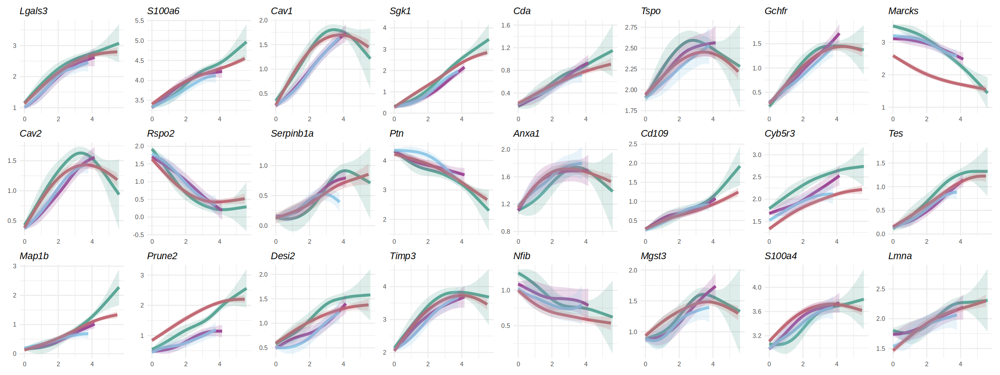

In [66]:
layer <- "integrated"
layer <- "corrected_integrated"
DefaultAssay(seu_tf) <- layer
plots <- list()
for (gene in rownames(markers)[1:min(nrow(markers), 24)]) {
    gene_ix <- which(gene_ids == gene)

    plotdata_dots <- seu_tf@meta.data
    plotdata_dots$expression <- Seurat::FetchData(seu_tf, vars = gene, assay = layer)[[1]]

    plotadata <- map_dfr(names(seus_tf), function(batch) {
        data <- plotdata_dots |> dplyr::filter(batch == !!batch)
        if (nrow(data) == 0) {
            return(tibble())
        }
        x <- data$Dose
        x_pred <- seq(0, quantile(x[x>0], 0.95), length.out = 100)
        x_noisy <- data$Dose_aligned + rnorm(nrow(data), sd = 0.05)
        y <- data$expression


        # Fit a GAM with a smoothing spline, just like smooth.spline
        gam_model <- gam(y ~ s(x_noisy, sp = 1), method = 'REML')

        # Make predictions
        y_pred <- predict(gam_model, newdata = data.frame(x_noisy = x_pred), type = 'response', se.fit = TRUE)

        # Extract predicted values and standard errors
        fit <- y_pred$fit
        se <- y_pred$se.fit

        # Calculate confidence intervals
        data.frame(x = x_pred, y = fit, se = se, batch = batch)
    })

    tryCatch(
    symbol <- convert_to_symbol(gene),
    error = function(e) {
        symbol <- gene
    }
    )
    

    options(repr.plot.width=3, repr.plot.height=3)
    plot <- ggplot(plotadata) + 
    geom_line(aes(x = x, y = y, color = batch), linewidth = 1.5) + 
    geom_ribbon(aes(x = x, ymin = y - se*2, ymax = y + se*2, fill = batch), alpha = 0.2) +
    # geom_point(aes(x = Dose, y = expression, color = batch), alpha = 0.1, data = plotdata_dots, size= 0.1) +
    theme_minimal() + 
    theme(legend.position = "None") + xlab("Dose") + ylab("Expression") + ggtitle(symbol) +
    theme(plot.title = element_text(face = "italic")) +
    scale_color_manual(values = batch_colors) + scale_fill_manual(values = batch_colors) +
    scale_y_continuous(name = NULL) +
    scale_x_continuous(name = NULL)

    plots <- c(plots, list(plot))
}
ncol <- min(8, length(plots))
nrow <- ceiling(length(plots) / ncol)
plot <- patchwork::wrap_plots(plots, ncol = ncol, nrow,)
if (name == "Fos_shared_with_human") {
    options(repr.plot.width=ncol * 1.5, repr.plot.height=nrow * 1.5)
} else {
    options(repr.plot.width=ncol * 2.5, repr.plot.height=nrow * 2.5)
}
plot

ggsave(file.path(plots_folder, paste0("dose_response_", name, ".pdf")), plot, width = options()$repr.plot.width, height = options()$repr.plot.height)

In [78]:
DefaultAssay(seu_tf) <- "corrected"

In [79]:
layer <- "corrected_integrated"
plotdatas <- list()
for (gene in rownames(markers)[1:500]) {
    gene_ix <- which(gene_ids == gene)

    plotdata_dots <- seu_tf@meta.data
    plotdata_dots$expression <- Seurat::FetchData(seu_tf, vars = gene, assay = layer)[[1]]

    plotadata <- map_dfr(names(seus_tf), function(batch) {
        data <- plotdata_dots |> dplyr::filter(batch == !!batch)
        if (nrow(data) == 0) {
            return(tibble())
        }
        x <- data$Dose
        x_pred <- seq(0, quantile(x[x>0], 0.95), length.out = 100)
        x_noisy <- data$Dose + rnorm(nrow(data), sd = 0.03)
        y <- data$expression


        # Fit a GAM with a smoothing spline, just like smooth.spline
        gam_model <- gam(y ~ s(x_noisy, sp = 1), method = 'REML')

        # Make predictions
        y_pred <- predict(gam_model, newdata = data.frame(x_noisy = x_pred), type = 'response', se.fit = TRUE)

        # Extract predicted values and standard errors
        fit <- y_pred$fit
        se <- y_pred$se.fit

        # Calculate confidence intervals
        data.frame(x = x_pred, y = fit, se = se, batch = batch, gene = gene)
    })

    plotdatas[[gene]] <- plotadata
}
plotdatas <- bind_rows(plotdatas)

In [80]:
plotdatas |> group_by(batch) |> summarise(x = max(x))

batch,x
<chr>,<dbl>
exp07,5.606681
exp09,4.159695
exp10,3.784190
exp14,5.501976


[1] 0.00000000 0.05557552 0.11115103 0.16672655 0.22230206 0.27787758
  [7] 0.33345309 0.38902861 0.44460412 0.50017964 0.55575515 0.61133067
 [13] 0.66690618 0.72248170 0.77805722 0.83363273 0.88920825 0.94478376
 [19] 1.00035928 1.05593479 1.11151031 1.16708582 1.22266134 1.27823685
 [25] 1.33381237 1.38938788 1.44496340 1.50053891 1.55611443 1.61168995
 [31] 1.66726546 1.72284098 1.77841649 1.83399201 1.88956752 1.94514304
 [37] 2.00071855 2.05629407 2.11186958 2.16744510 2.22302061 2.27859613
 [43] 2.33417165 2.38974716 2.44532268 2.50089819 2.55647371 2.61204922
 [49] 2.66762474 2.72320025 2.77877577 2.83435128 2.88992680 2.94550231
 [55] 3.00107783 3.05665335 3.11222886 3.16780438 3.22337989 3.27895541
 [61] 3.33453092 3.39010644 3.44568195 3.50125747 3.55683298 3.61240850
 [67] 3.66798401 3.72355953 3.77913504 3.83471056 3.89028608 3.94586159
 [73] 4.00143711 4.05701262 4.11258814 4.16816365 4.22373917 4.27931468
 [79] 4.33489020 4.39046571 4.44604123 4.50161674 4.55719226 4.61276778
 [85] 4.66834329 4.72391881 4.77949432 4.83506984 4.89064535 4.94622087
 [91] 5.00179638 5.05737190 5.11294741 5.16852293 5.22409844 5.27967396
 [97] 5.33524948 5.39082499 5.44640051 5.50197602

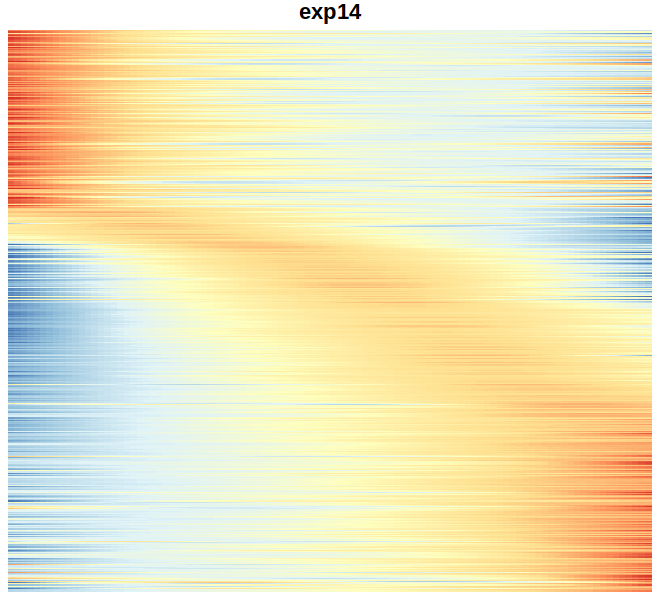

In [81]:
plotdata <- plotdatas |> filter(batch == 'exp14') |> dplyr::select(gene, x, y) |> tidyr::pivot_wider(names_from = gene, values_from = y)
ordered <- order(apply(plotdata, 2, which.max))

plotdata2 <- as.matrix(t(plotdata))[ordered,]

options(repr.plot.width=max(plotdata$x), repr.plot.height=5)
plot <- pheatmap::pheatmap(plotdata2, cluster_rows = F, cluster_cols = F, show_rownames = F, show_colnames = F, scale = "row", main = "exp14", breaks = seq(-3, 3, length.out = 101), border_color = NA, legend = F)
plotdata$x

# save plot
ggsave(file.path(plots_folder, paste0("dose_response_", TF_oi, "_heatmap_", "exp14", ".pdf")), plot, width = max(plotdata$x), height = 5)


[1] 0.00000000 0.04201712 0.08403423 0.12605135 0.16806847 0.21008558
  [7] 0.25210270 0.29411981 0.33613693 0.37815405 0.42017116 0.46218828
 [13] 0.50420540 0.54622251 0.58823963 0.63025674 0.67227386 0.71429098
 [19] 0.75630809 0.79832521 0.84034233 0.88235944 0.92437656 0.96639367
 [25] 1.00841079 1.05042791 1.09244502 1.13446214 1.17647926 1.21849637
 [31] 1.26051349 1.30253060 1.34454772 1.38656484 1.42858195 1.47059907
 [37] 1.51261619 1.55463330 1.59665042 1.63866753 1.68068465 1.72270177
 [43] 1.76471888 1.80673600 1.84875312 1.89077023 1.93278735 1.97480446
 [49] 2.01682158 2.05883870 2.10085581 2.14287293 2.18489005 2.22690716
 [55] 2.26892428 2.31094139 2.35295851 2.39497563 2.43699274 2.47900986
 [61] 2.52102698 2.56304409 2.60506121 2.64707832 2.68909544 2.73111256
 [67] 2.77312967 2.81514679 2.85716391 2.89918102 2.94119814 2.98321525
 [73] 3.02523237 3.06724949 3.10926660 3.15128372 3.19330084 3.23531795
 [79] 3.27733507 3.31935218 3.36136930 3.40338642 3.44540353 3.48742065
 [85] 3.52943777 3.57145488 3.61347200 3.65548912 3.69750623 3.73952335
 [91] 3.78154046 3.82355758 3.86557470 3.90759181 3.94960893 3.99162605
 [97] 4.03364316 4.07566028 4.11767739 4.15969451

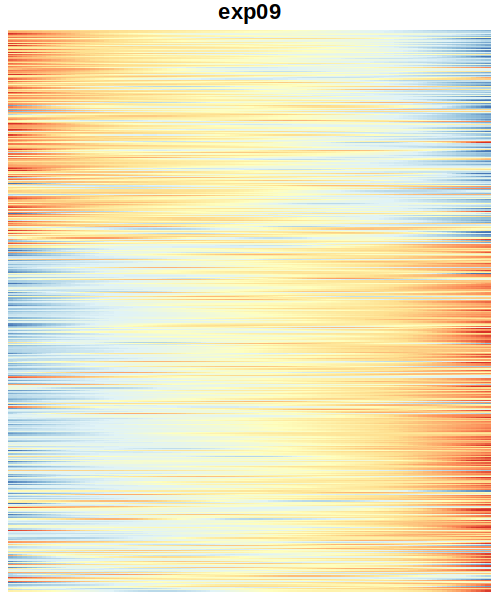

In [82]:
plotdata <- plotdatas |> filter(batch == 'exp09') |> dplyr::select(gene, x, y) |> tidyr::pivot_wider(names_from = gene, values_from = y)

plotdata2 <- as.matrix(t(plotdata))[ordered,]

options(repr.plot.width=max(plotdata$x), repr.plot.height=5)
plot <- pheatmap::pheatmap(plotdata2, cluster_rows = F, cluster_cols = F, show_rownames = F, show_colnames = F, scale = "row", main = "exp09", breaks = seq(-3, 3, length.out = 101), border_color = NA, legend = F)
plotdata$x

# save plot
ggsave(file.path(plots_folder, paste0("dose_response_", TF_oi, "_heatmap_", "exp09", ".pdf")), plot, width = max(plotdata$x), height = 5)


[1] 0.00000000 0.03822414 0.07644828 0.11467241 0.15289655 0.19112069
  [7] 0.22934483 0.26756896 0.30579310 0.34401724 0.38224138 0.42046551
 [13] 0.45868965 0.49691379 0.53513793 0.57336207 0.61158620 0.64981034
 [19] 0.68803448 0.72625862 0.76448275 0.80270689 0.84093103 0.87915517
 [25] 0.91737931 0.95560344 0.99382758 1.03205172 1.07027586 1.10849999
 [31] 1.14672413 1.18494827 1.22317241 1.26139654 1.29962068 1.33784482
 [37] 1.37606896 1.41429310 1.45251723 1.49074137 1.52896551 1.56718965
 [43] 1.60541378 1.64363792 1.68186206 1.72008620 1.75831033 1.79653447
 [49] 1.83475861 1.87298275 1.91120689 1.94943102 1.98765516 2.02587930
 [55] 2.06410344 2.10232757 2.14055171 2.17877585 2.21699999 2.25522413
 [61] 2.29344826 2.33167240 2.36989654 2.40812068 2.44634481 2.48456895
 [67] 2.52279309 2.56101723 2.59924136 2.63746550 2.67568964 2.71391378
 [73] 2.75213792 2.79036205 2.82858619 2.86681033 2.90503447 2.94325860
 [79] 2.98148274 3.01970688 3.05793102 3.09615516 3.13437929 3.17260343
 [85] 3.21082757 3.24905171 3.28727584 3.32549998 3.36372412 3.40194826
 [91] 3.44017239 3.47839653 3.51662067 3.55484481 3.59306895 3.63129308
 [97] 3.66951722 3.70774136 3.74596550 3.78418963

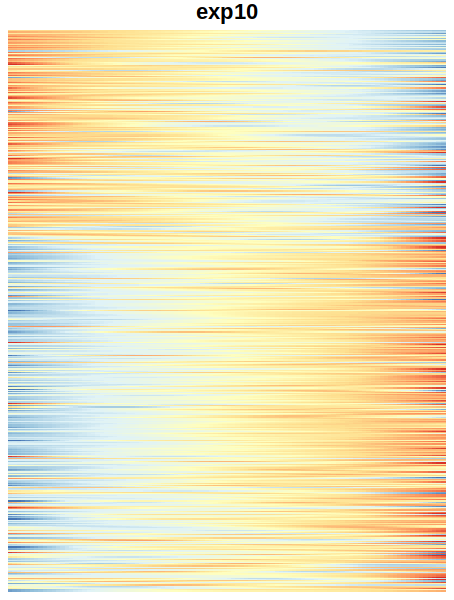

In [ ]:
plotdata <- plotdatas |> filter(batch == 'exp10') |> dplyr::select(gene, x, y) |> tidyr::pivot_wider(names_from = gene, values_from = y)

plotdata2 <- as.matrix(t(plotdata))[ordered,]

options(repr.plot.width=max(plotdata$x), repr.plot.height=5)
plot <- pheatmap::pheatmap(plotdata2, cluster_rows = F, cluster_cols = F, show_rownames = F, show_colnames = F, scale = "row", main = "exp10", breaks = seq(-3, 3, length.out = 101), border_color = NA, legend = F)
plotdata$x

# save plot
ggsave(file.path(plots_folder, paste0("dose_response_", TF_oi, "_heatmap_", "exp10", ".pdf")), plot, width = max(plotdata$x), height = 5)

[1] 0.00000000 0.05663314 0.11326628 0.16989942 0.22653256 0.28316570
  [7] 0.33979884 0.39643198 0.45306512 0.50969826 0.56633140 0.62296454
 [13] 0.67959768 0.73623082 0.79286396 0.84949710 0.90613024 0.96276338
 [19] 1.01939652 1.07602966 1.13266280 1.18929594 1.24592908 1.30256222
 [25] 1.35919536 1.41582850 1.47246164 1.52909478 1.58572792 1.64236106
 [31] 1.69899420 1.75562734 1.81226048 1.86889362 1.92552676 1.98215990
 [37] 2.03879304 2.09542618 2.15205932 2.20869246 2.26532560 2.32195874
 [43] 2.37859188 2.43522502 2.49185816 2.54849130 2.60512444 2.66175758
 [49] 2.71839072 2.77502386 2.83165700 2.88829014 2.94492328 3.00155642
 [55] 3.05818956 3.11482270 3.17145584 3.22808898 3.28472212 3.34135526
 [61] 3.39798840 3.45462154 3.51125468 3.56788782 3.62452096 3.68115410
 [67] 3.73778724 3.79442038 3.85105352 3.90768666 3.96431980 4.02095294
 [73] 4.07758608 4.13421922 4.19085236 4.24748550 4.30411864 4.36075178
 [79] 4.41738492 4.47401806 4.53065120 4.58728434 4.64391748 4.70055062
 [85] 4.75718376 4.81381690 4.87045004 4.92708318 4.98371632 5.04034946
 [91] 5.09698260 5.15361574 5.21024888 5.26688202 5.32351516 5.38014830
 [97] 5.43678144 5.49341458 5.55004772 5.60668086

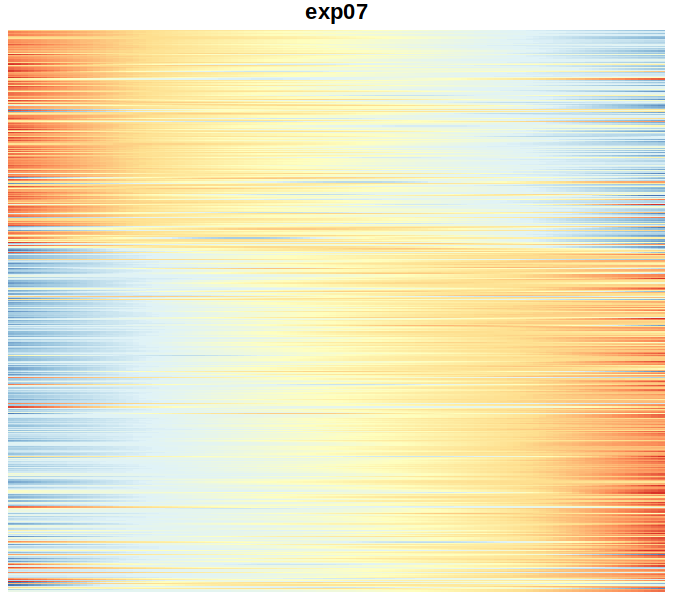

In [84]:
plotdata <- plotdatas |> filter(batch == 'exp07') |> dplyr::select(gene, x, y) |> tidyr::pivot_wider(names_from = gene, values_from = y)

plotdata2 <- as.matrix(t(plotdata))[ordered,]

options(repr.plot.width=max(plotdata$x), repr.plot.height=5)
plot <- pheatmap::pheatmap(plotdata2, cluster_rows = F, cluster_cols = F, show_rownames = F, show_colnames = F, scale = "row", main = "exp07", breaks = seq(-3, 3, length.out = 101), border_color = NA, legend = F)
plotdata$x

# save plot
ggsave(file.path(plots_folder, paste0("dose_response_", TF_oi, "_heatmap_", "exp07", ".pdf")), plot, width = max(plotdata$x), height = 5)


In [85]:
plotdata1 <- plotdatas |> filter(batch == 'exp07') |> dplyr::select(gene, x, y) |> tidyr::pivot_wider(names_from = gene, values_from = y)
plotdata2 <- plotdatas |> filter(batch == 'exp14') |> dplyr::select(gene, x, y) |> tidyr::pivot_wider(names_from = gene, values_from = y)

## Scaling

In [87]:
seu2$batch_overall <- unname(c(exp05 = "batch1", exp06 = "batch1", exp07 = "batch2", exp08 = "batch2", exp09 = "batch3", exp10 = "batch4", exp11 = "batch4", `exp12-13`="batch5", exp14 = "batch6")[seu2$batch])

In [88]:
# I just don't trust IRF3, it is way too variable between batches
max_doses <- seu2@meta.data |> arrange(-Dose) |> group_by(batch_overall, TF) |> summarize(Dose = quantile(Dose, 0.9)) |> ungroup() |> dplyr::select(batch_overall, TF, Dose) |> filter(!(TF %in% c("D0", "D0_confluent", "Adipo_ref", "Irf3", "Bhlhe40", "Vdr")))

# Only take TFs with high enough absolute dose
max_doses_selected <- max_doses |> filter(Dose > 3.5)

`summarise()` has grouped output by 'batch_overall'. You can override using the
`.groups` argument.


In [89]:
# Only take TFs in batch2 and batch 6
tfs_oi <- max_doses_selected |> dplyr::filter(batch_overall %in% c("batch2", "batch6")) |> group_by(TF, batch_overall) |> summarise(n = n()) |> group_by(TF) |> summarise(n = n()) |> arrange(desc(n)) |> filter(n >= 2)  |> pull(TF)

`summarise()` has grouped output by 'TF'. You can override using the `.groups`
argument.


In [18]:
# tfs_oi <- c("Pparg", "Mycn")
# tfs_oi <- c("Klf4")

In [90]:
mappings_tfs <- list()

for (tf in tfs_oi) {
    print(tf)

    # filter on batches with high dose
    batches <- max_doses_selected |> filter(TF == tf) |> pull(batch_overall)
    seu_tf <- select_tf_dataset(seu, tf, batches = batches)
    seus_tf <- select_tf_datasets(seu, tf, batches = batches)

    DefaultAssay(seu_tf) <- "corrected"

    # take the union of 1000 variable genes
    features <- c()
    for (batch in batches) {
        stds <- apply(seu_tf[,seu_tf$batch_overall == batch]@assays$corrected@data, 1, sd) 
        features <- c(features, rownames(seu_tf@assays$corrected@data)[order(-stds)][1:1000])
    }
    VariableFeatures(seu_tf) <- unique(features)
    # VariableFeatures(seu_tf) <- rownames(seu_tf)

    layer <- "corrected"
    spline_values_batches <- map(seus_tf, function(seu) {
        Y <- t(seu@assays[[layer]]@data[VariableFeatures(seu_tf), ])
        x <- seu$Dose

        # xmax <- max(x)
        xmax <- quantile(x[x>0], 0.9)

        knots <- c(seq(0, xmax, 0.5), xmax)
        
        x_desired <- c(seq(0., xmax,by = 0.025), xmax)
        # x_desired <- c(seq(0., xmax,length.out=100), xmax)
        
        spline_values <- apply(Y, 2, function(y) {
            if (sum(y > 0) < 3) {
                return(rep(0, length(x_desired)))
            }
            spline <- smooth.spline(x, y, all.knots = knots, tol = 0.5)
            predict(spline, x_desired)$y
        })

        return(list(y = spline_values, x = x_desired))
    })

    # combinations = data.frame(t(combn(names(spline_values_batches), 2)))
    combinations = expand.grid(names(spline_values_batches), names(spline_values_batches))
    colnames(combinations) <- c("batch1", "batch2")
    combinations$oi <- map2_lgl(combinations$batch1, combinations$batch2, function(batch1, batch2) {
        # check whether batch1 is earlier than batch 2 in the levels
        return (which(names(spline_values_batches) == batch1) > which(names(spline_values_batches) == batch2))
    })
    combinations <- combinations |> dplyr::filter(oi)

    mapping <- function(scaling, x1, x2, y1, y2){
        x2_scaled <- x2 * scaling
        mapping <- map_int(x2_scaled, ~which.min(abs(x1 - .x)))
        dist1 <- sum(rowMeans((y1[mapping, ] - y2[, ])**2))

        x1_scaled <- x1 / scaling
        mapping <- map_int(x1_scaled, ~which.min(abs(x2 - .x)))
        dist2 <- sum(rowMeans((y2[mapping, ] - y1[, ])**2))

        return(dist1 + dist2)
    }

    combinations_oi <- combinations |> dplyr::filter(oi)

    mappings <- map2_dfr(combinations_oi$batch1, combinations_oi$batch2, function(batch1, batch2) {
        y1 <- spline_values_batches[[batch1]]$y
        y2 <- spline_values_batches[[batch2]]$y

        # center at Dose 0
        y1 <- sweep(y1, 2, y1[1, ], "-")
        y2 <- sweep(y2, 2, y2[1, ], "-")

        x1 <- spline_values_batches[[batch1]]$x
        x2 <- spline_values_batches[[batch2]]$x

        scalers <- 2**(seq(-2., 2., length.out = 100))
        distances <- purrr::map_dbl(scalers, mapping, x1 = x1, x2 = x2, y1 = y1, y2 = y2)
        plotdata <- tibble(scaling = scalers, distance = distances, batch1 = batch1, batch2 = batch2)
    })

    mappings_tfs[[tf]] <- mappings
}

[1] "Egr1"
[1] "Esr2"
[1] "Etv1"
[1] "Fos"
[1] "Grhl2"
[1] "Meis2"
[1] "Pou5f1"
[1] "Zfp24"
[1] "Zfp692"


In [396]:
mappings <- map2_dfr(mappings_tfs, names(mappings_tfs), function(df, name) {mutate(df, tf = name)})# |> filter(distance < 20)

In [397]:
mappings$pair <- paste(mappings$tf, mappings$batch1, mappings$batch2)

mappings_oi <- mappings
# mappings_oi <- mappings |> dplyr::filter(batch1 == "batch4" & batch2 == "batch3")
# mappings_oi <- mappings |> dplyr::filter(batch1 == "batch2" & batch2 == "batch1")
# mappings_oi <- mappings |> dplyr::filter(batch1 == "batch3" & batch2 == "batch1")
# mappings_oi <- mappings |> dplyr::filter(batch1 == "batch6" & batch2 == "batch2")
# mappings_oi <- mappings |> dplyr::filter(batch1 == "batch6" & batch2 == "batch1")
mappings_oi <- mappings |> dplyr::filter(batch1 == "batch6" & batch2 == "batch2")
optimal_mappings <- mappings_oi |> arrange(distance) |> group_by(tf, batch1, batch2) |> dplyr::slice(1)# |> filter(scaling > 0.75) |> filter(scaling < 1.5)
final_mappings <- mappings_oi |> group_by(tf, batch1, batch2) |> dplyr::slice(which.max(scaling))
optimal_mapping <- exp(mean(log(optimal_mappings$scaling)))
mappings_oi$label <- toupper(mappings_oi$tf)
optimal_mappings$label <- toupper(optimal_mappings$tf)
final_mappings$label <- toupper(final_mappings$tf)

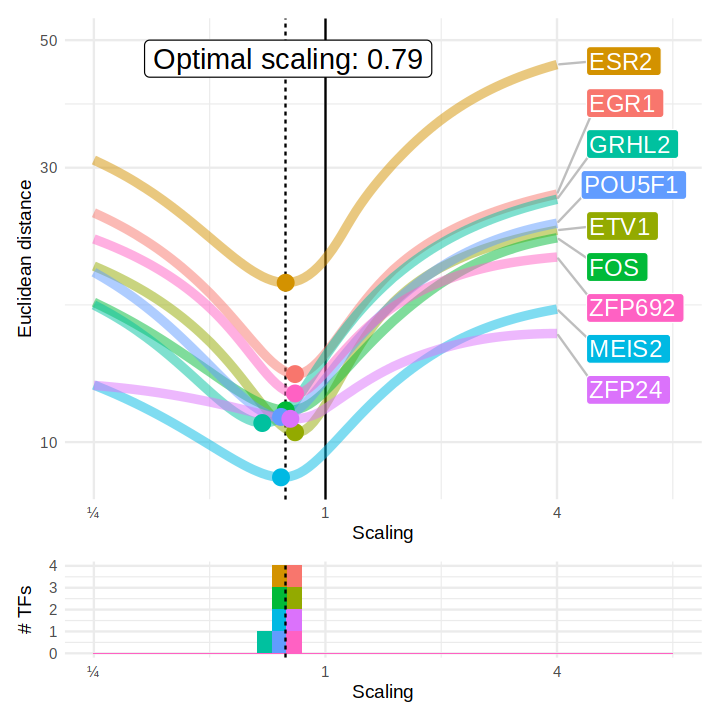

In [401]:
options(repr.plot.width=6, repr.plot.height=6)
plot1 <- ggplot(mappings_oi) + 
geom_vline(xintercept = optimal_mapping, linetype = "dashed") +
geom_vline(xintercept = 1) +
geom_line(aes(x = scaling, y = distance, color = pair), size = 2, alpha = 0.5) + 
scale_x_log10(name = "Scaling", breaks = c(1/4, 1, 4), labels = c("¼", 1, 4), limits = c(1/4, 8)) + 
scale_y_log10() +
theme_minimal() + 
geom_point(data = optimal_mappings, aes(x = scaling, y = distance, color = pair), size = 4) +
ggrepel::geom_label_repel(data = final_mappings, aes(label = label, x = scaling, y = distance, fill = pair), color = "white", segment.color = "grey", segment.size = 0.5, nudge_y = 0, nudge_x = 0.1, lineheight = 1.2, size = 5, direction = "y", hjust = 0.) +
geom_label(data = tibble(x = 0.8, y = 50, label = paste0("Optimal scaling: ", round(optimal_mapping, 2))), aes(x = x, y = y, label = label), hjust = 0.5, vjust = 1, size = 6) +
theme(legend.position = "none") + ylab("Euclidean distance")

plot2 <- ggplot(optimal_mappings) + geom_histogram(aes(x = scaling, fill = label), breaks = exp(seq(log(min(mappings$scaling)), log(8), length.out = 40))) + scale_x_log10(name = "Scaling", breaks = c(1/4, 1, 4), labels = c("¼", 1, 4), limits = c(1/4, 8)) + theme_minimal()  +
geom_vline(xintercept = optimal_mapping, linetype = "dashed") +
theme(legend.position = "none") + ylab("# TFs")

plot <- patchwork::wrap_plots(plot1, plot2, ncol = 1, heights = c(5, 1))
ggsave(file.path(plots_folder, "scaling.pdf"), plot, width = 6, height = 7)
plot

In [465]:
optimal_mappings

scaling,distance,batch1,batch2,tf,pair,label
<dbl>,<dbl>,<fct>,<fct>,<chr>,<chr>,<chr>
0.8335691,13.129609,batch6,batch2,Egr1,Egr1 batch6 batch2,EGR1
0.7881629,18.927376,batch6,batch2,Esr2,Esr2 batch6 batch2,ESR2
0.8335691,10.401548,batch6,batch2,Etv1,Etv1 batch6 batch2,ETV1
0.7881629,11.356412,batch6,batch2,Fos,Fos batch6 batch2,FOS
0.6851755,10.792782,batch6,batch2,Grhl2,Grhl2 batch6 batch2,GRHL2
0.7663958,8.684366,batch6,batch2,Meis2,Meis2 batch6 batch2,MEIS2
0.7663958,11.059139,batch6,batch2,Pou5f1,Pou5f1 batch6 batch2,POU5F1
0.8105481,10.977397,batch6,batch2,Zfp24,Zfp24 batch6 batch2,ZFP24
0.8335691,12.149629,batch6,batch2,Zfp692,Zfp692 batch6 batch2,ZFP692


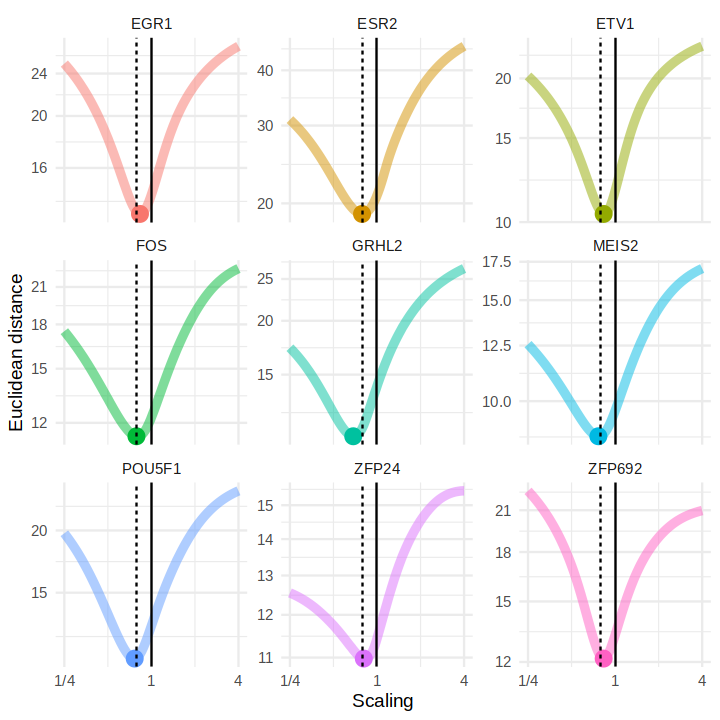

In [400]:
plot <- mappings_oi |> 
    ggplot(aes(x = scaling, y = distance, color = label)) + 
    geom_line(size=2, alpha = 0.5) + 
    # geom_vline(aes(xintercept = scaling, color = tf), data = optimal_mappings, linetype = "dashed") +
    geom_point(aes(x = scaling, y = distance, color = label), data = optimal_mappings, size = 4) +
    facet_wrap(~label,scales = "free_y") + 
    scale_y_log10() + 
    scale_x_log10(breaks = c(1/4, 1, 4), labels = c("1/4", "1", "4")) +
    theme_minimal() + 
    geom_vline(xintercept = optimal_mapping, linetype = "dashed") +
    geom_vline(xintercept = 1) +
    theme(legend.position = "None") +
    xlab("Scaling") + ylab("Euclidean distance")
ggsave(file.path(plots_folder, "scaling_individual.pdf"), plot, width = 6, height = 7)
plot

### Look at genes before and after

In [ ]:
batch_colors <- c(exp05 = "#8da0ca", exp06 = "#e38cbb", exp07 = "#a6d056", exp08 = "#fed82f", exp09 = "#e4c494", exp10 = "#66c2a5", exp11 = "#fc8d62", `exp12-13` = "#ffcccc", exp14 = "#cc9999")

In [65]:
# TF_oi <- "Fos"
TF_oi <- "Esr2"
TF_oi <- "Egr1"
TF_oi <- "Meis2"
TF_oi <- "Pou5f1"
TF_oi <- "Grhl2"

seu_tf <- select_tf_dataset(seu2, TF_oi) # use original data for differential genes
seu_tf <- SetIdent(seu_tf, value = "TF")
markers <- FindMarkers(seu_tf, ident.1 = "D0_confluent", ident.2 = TF_oi)
markers <- markers[!(rownames(markers) %in% c("ENSMUSG00000086474", "ENSMUSG00000111467", "ENSMUSG00000097652", "ENSMUSG00000093507", "ENSMUSG00000085604", "ENSMUSG00000001119", "ENSMUSG00000020241")), ]

In [66]:
seu_tf <- select_tf_dataset(seu, TF_oi, batches = c("batch2", "batch6")) # use original data for differential genes
seus_tf <- select_tf_datasets_batch(seu, TF_oi, batches = c("exp07", "exp14")) # use corrected data for plotting

In [67]:
layer <- "corrected_integrated"
gene_ids <- VariableFeatures(seu_tf)

In [68]:
plots <- list()
for (gene in rownames(markers)[1:12]) {
    gene_ix <- which(gene_ids == gene)

    for (aligned in c(F, T)) {
        plotdata_dots <- seu_tf@meta.data
        plotdata_dots$expression <- Seurat::FetchData(seu_tf, vars = gene, assay = layer)[[1]]

        plotadata <- map_dfr(names(seus_tf), function(batch) {
            data <- plotdata_dots |> dplyr::filter(batch == !!batch)
            if (nrow(data) == 0) {
                return(tibble())
            }
            if (aligned) {
                x <- data$Dose_aligned
                x_noisy <- data$Dose_aligned + rnorm(nrow(data), sd = 0.1)
                x_pred <- seq(0, quantile(x[x>0], 0.95), length.out = 100)
            } else {
                x <- data$Dose
                x_noisy <- data$Dose + rnorm(nrow(data), sd = 0.1)
                x_pred <- seq(0, quantile(x[x>0], 0.95), length.out = 100)
            }
            y <- data$expression


            # Fit a GAM with a smoothing spline, just like smooth.spline
            gam_model <- gam(y ~ s(x_noisy, sp = 1), method = 'REML')

            # Make predictions
            y_pred <- predict(gam_model, newdata = data.frame(x_noisy = x_pred), type = 'response', se.fit = TRUE)

            # Extract predicted values and standard errors
            fit <- y_pred$fit
            se <- y_pred$se.fit

            # Calculate confidence intervals
            data.frame(x = x_pred, y = fit, se = se, batch = batch)
        })

        tryCatch(
        symbol <- convert_to_symbol(gene),
        error = function(e) {
            symbol <- gene
        }
        )

        options(repr.plot.width=3, repr.plot.height=3)
        plot <- ggplot(plotadata) + 
        geom_line(aes(x = x, y = y, color = batch), linewidth = 1.5) + 
        geom_ribbon(aes(x = x, ymin = y - se*2, ymax = y + se*2, fill = batch), alpha = 0.2) +
        # geom_point(aes(x = Dose, y = expression, color = batch), alpha = 0.1, data = plotdata_dots, size= 0.1) +
        theme_minimal() + 
        theme(legend.position = "None") + xlab("Dose") + ylab("Expression") + ggtitle(ifelse(aligned, paste0(symbol, " aligned"), symbol)) +
        scale_color_manual(values = batch_colors) + scale_fill_manual(values = batch_colors) +
        scale_y_continuous(name = NULL) +
        scale_x_continuous(name = NULL)

        plots <- c(plots, list(plot))
    }
}
ncol <- min(8, length(plots))
nrow <- ceiling(length(plots) / ncol)
plot <- patchwork::wrap_plots(plots, ncol = ncol, nrow,)
options(repr.plot.width=ncol * 2.5, repr.plot.height=nrow * 2.5)
plot

ggsave(file.path(plots_folder, paste0("dose_response_", TF_oi, "_aligned.pdf")), plot, width = ncol * 2.5, height = nrow * 2.5)

ERROR: [1m[33mError[39m in `map()`:[22m
[1m[22m[36mℹ[39m In index: 1.
[1mCaused by error in `seq.default()`:[22m
[33m![39m 'to' must be a finite number


In [34]:
get_ensembl_id <- function(symbol) {
    ensembl <- biomaRt::useMart("ensembl", dataset = "mmusculus_gene_ensembl")
    genes <- biomaRt::getBM(attributes = c("ensembl_gene_id", "external_gene_name"), filters = "external_gene_name", values = symbol, mart = ensembl)
    return(genes$ensembl_gene_id)
}

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns



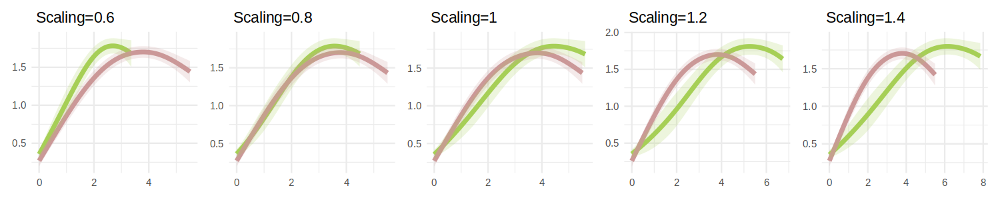

In [40]:
plots <- list()
for (gene in convert_to_ensembl("Cav1")) {
    gene_ix <- which(gene_ids == gene)

    for (scaling in c(0.6, 0.8, 1, 1.2, 1.4)) {
        plotdata_dots <- seu_tf@meta.data
        plotdata_dots$expression <- Seurat::FetchData(seu_tf, vars = gene, assay = layer)[[1]]

        plotadata <- map_dfr(names(seus_tf), function(batch) {
            data <- plotdata_dots |> dplyr::filter(batch == !!batch)
            if (nrow(data) == 0) {
                return(tibble())
            }
            data$Dose <- ifelse(data$batch == "exp07", data$Dose * scaling, data$Dose)
            x <- data$Dose
            x_noisy <- data$Dose + rnorm(nrow(data), sd = 0.1)
            x_pred <- seq(0, quantile(x[x>0], 0.95), length.out = 100)
            y <- data$expression

            # Fit a GAM with a smoothing spline, just like smooth.spline
            gam_model <- gam(y ~ s(x_noisy, sp = 1), method = 'REML')

            # Make predictions
            y_pred <- predict(gam_model, newdata = data.frame(x_noisy = x_pred), type = 'response', se.fit = TRUE)

            # Extract predicted values and standard errors
            fit <- y_pred$fit
            se <- y_pred$se.fit

            # Calculate confidence intervals
            data.frame(x = x_pred, y = fit, se = se, batch = batch)
        })

        tryCatch(
        symbol <- convert_to_symbol(gene),
        error = function(e) {
            symbol <- gene
        }
        )

        options(repr.plot.width=3, repr.plot.height=3)
        plot <- ggplot(plotadata) + 
        geom_line(aes(x = x, y = y, color = batch), linewidth = 1.5) + 
        geom_ribbon(aes(x = x, ymin = y - se*2, ymax = y + se*2, fill = batch), alpha = 0.2) +
        # geom_point(aes(x = Dose, y = expression, color = batch), alpha = 0.1, data = plotdata_dots, size= 0.1) +
        theme_minimal() + 
        theme(legend.position = "None") + xlab("Dose") + ylab("Expression") + ggtitle(paste0(" Scaling=", scaling)) +
        scale_color_manual(values = batch_colors) + scale_fill_manual(values = batch_colors) +
        scale_y_continuous(name = NULL) +
        scale_x_continuous(name = NULL)

        plots <- c(plots, list(plot))
    }
}
ncol <- min(8, length(plots))
nrow <- ceiling(length(plots) / ncol)
plot <- patchwork::wrap_plots(plots, ncol = ncol, nrow,)
options(repr.plot.width=ncol * 2.5, repr.plot.height=nrow * 2.5)
plot

ggsave(file.path(plots_folder, paste0("dose_response_", TF_oi, "_aligned_example.pdf")), plot, width = ncol * 2.5, height = nrow * 2.5)